# QNLP Paper Code

In [1]:
# Importing the Google Drive module from Google Colab
# This allows access to files stored in Google Drive directly from this Colab environment.
from google.colab import drive

# Connecting the Colab environment to the user's Google Drive
# '/content/drive' is the location in Colab where the Drive's files will appear, like mounting a USB drive to a computer.
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install discopy==0.3.5  # Installs a library for diagrammatic reasoning, often used in quantum computing.
!pip install qiskit==0.25.4  # Installs a framework for creating and running quantum circuits.
!pip install pytket  # Installs a library for interfacing with quantum devices and simulators.
!pip install pytket-qiskit  # Installs a library to integrate pytket with qiskit for quantum computing.
!pip install qiskit qiskit_ionq pylatexenc  # Installing additional required libraries.

  Using cached qiskit-0.25.4.tar.gz (11 kB)
  Preparing metadata (setup.py) ... done
  Using cached qiskit-terra-0.17.2.tar.gz (5.4 MB)
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [3]:
from time import time  # To measure the execution time of processes.
import pickle  # For saving and loading Python objects to/from files.
import numpy as np  # For numerical computations with arrays and matrices.

<h2>mc_task.ipynb</h2>

In [4]:
#*****************************************************************************************************
# Fix settings concerning the ansatz, optimisation and backend
#*****************************************************************************************************

from discopy import Ty, Id, Box, Diagram, Word  # Importing core tools for diagrammatic reasoning.
from discopy.rigid import Cup, Cap, Functor, Swap  # Importing structures for quantum and categorical reasoning.
from discopy.quantum.circuit import bit, qubit  # Quantum circuit elements (classical and quantum bits).
from discopy.quantum import Measure  # Quantum measurement tools.
from discopy.quantum.tk import to_tk  # Conversion to pytket circuits.
from discopy.quantum.tk import Circuit as tk_Circuit_inDCP  # Pytket-compatible circuit representation.

from qiskit_ibm_runtime import Sampler, Estimator, QiskitRuntimeService, Session  # Tools for IBM quantum hardware.

from pytket.extensions.qiskit import AerBackend, IBMQBackend, IBMQEmulatorBackend, tk_to_qiskit  # Pytket-IBM integrations.
from pytket import Circuit as tk_Circuit  # Alternative quantum circuit representation.
from qiskit_ionq import IonQProvider  # IonQ quantum computing provider integration.

#-----------------------------
# Atomic pregroup grammar types
#-----------------------------
s, n = Ty('S'), Ty('N')  # Defines grammatical types for sentences (s) and nouns (n).

#----------------------------------------
# Settings concerning the ansatz
#----------------------------------------
q_s = 1        # Number of qubits for sentence type.
q_n = 1        # Number of qubits for noun type.
depth = 1      # Depth of the circuit for complex words.
p_n = 3        # Parameters for single-qubit nouns, controlling word representation complexity.

#----------------------------------------
# Parameters concerning the optimisation
#----------------------------------------
n_runs = 1      # Number of training runs.
niter  = 2     # Iterations per training run.

#----------------------------------------
# Parameters for quantum computation
#----------------------------------------
max_n_shots = 2 ** 13  # Maximum quantum computation shots allowed.

#---------------------
# Fix the backend
#---------------------
provider = IonQProvider("j7z3pwa75Nn8bd4fq5jxBEZLLKz4rfTy")  # Connect to IonQ provider.
# backend = provider.get_backend("ionq_qpu.aria-1")  # Uncomment to use the IonQ backend.

backend = AerBackend()  # Use a local quantum simulator as the backend.

#******************************************
# Data import
#******************************************

# Load training, development, and testing datasets from Google Drive.
with open('/content/drive/Shared drives/QML-198-2024/Teams/WINNERS/dataset/mc_train_data.txt') as f:
    training_data_raw = f.readlines()
with open('/content/drive/Shared drives/QML-198-2024/Teams/WINNERS/dataset/mc_dev_data.txt') as f:
    dev_data_raw = f.readlines()
with open('/content/drive/Shared drives/QML-198-2024/Teams/WINNERS/dataset/mc_test_data.txt') as f:
    testing_data_raw = f.readlines()

#***************************************************************
# Turn the raw input data into data structures convenient below
#***************************************************************

vocab = dict()  # Dictionary mapping words to their parts of speech.
data = dict()   # Dictionary mapping sentences to their labels.
training_data = []  # List of training sentences.
dev_data = []       # List of development sentences.
testing_data = []   # List of testing sentences.

# Process training data to extract sentences and their labels.
for sent in training_data_raw:
    words = sent[2:].split()
    sent_untagged = ''
    for word in words:
        word_untagged, tag = word.split('_')
        vocab[word_untagged] = tag
        sent_untagged += word_untagged + ' '
    sentence = sent_untagged[:-1]
    training_data.append(sentence)
    label = np.array([1.0, 0.0]) if sent[0] == '1' else np.array([0.0, 1.0])
    data[sentence] = label

# Process development data.
for sent in dev_data_raw:
    words = sent[2:].split()
    sent_untagged = ''
    for word in words:
        word_untagged, tag = word.split('_')
        vocab[word_untagged] = tag
        sent_untagged += word_untagged + ' '
    sentence = sent_untagged[:-1]
    dev_data.append(sentence)
    label = np.array([1.0, 0.0]) if sent[0] == '1' else np.array([0.0, 1.0])
    data[sentence] = label

# Process testing data.
for sent in testing_data_raw:
    words = sent[2:].split()
    sent_untagged = ''
    for word in words:
        word_untagged, tag = word.split('_')
        vocab[word_untagged] = tag
        sent_untagged += word_untagged + ' '
    sentence = sent_untagged[:-1]
    testing_data.append(sentence)
    label = np.array([1.0, 0.0]) if sent[0] == '1' else np.array([0.0, 1.0])
    data[sentence] = label

/usr/local/lib/python3.10/dist-packages/qiskit_ionq/helpers.py:563: UserWarning: Unable to get qubit count for simulator: 'qubits'. Defaulting to 100.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/qiskit_ionq/helpers.py:563: UserWarning: Unable to get qubit count for ionq_qpu: 'qubits'. Defaulting to 100.
  warnings.warn(


In [5]:
#*****************************************************
# The sentences as diagrams via CFG production rules
#*****************************************************

#----------------------------
# Further POS tags:
#----------------------------
nphr, adj, tv, iv, vphr = Ty('NP'), Ty('ADJ'), Ty('TV'), Ty('IV'), Ty('VP')  # Additional grammatical types.

#----------------------------
# The vocabulary in DisCoPy
#----------------------------
vocab_dict_boxes = dict()  # A dictionary to hold DisCoPy word objects by their POS tags.
for word, tag in vocab.items():
    if tag == 'N':  # If the word is a noun, assign it as a DisCoPy word with type `n`.
        vocab_dict_boxes.update({word: Word(word, n)})
    if tag == 'TV':  # If the word is a transitive verb, assign it as a DisCoPy word with type `tv`.
        vocab_dict_boxes.update({word: Word(word, tv)})
    if tag == 'ADJ':  # If the word is an adjective, assign it as a DisCoPy word with type `adj`.
        vocab_dict_boxes.update({word: Word(word, adj)})

#-------------------------------------
# The CFG production rules as boxes
#-------------------------------------
r0 = Box('R0', nphr @ vphr, s)  # Combines a noun phrase (NP) and verb phrase (VP) into a sentence (S).
r1 = Box('R1', tv @ nphr, vphr)  # Combines a transitive verb (TV) and noun phrase (NP) into a verb phrase (VP).
r2 = Box('R2', adj @ n, nphr)  # Combines an adjective (ADJ) and noun (N) into a noun phrase (NP).
r3 = Box('R3', iv, vphr)  # Converts an intransitive verb (IV) into a verb phrase (VP).
r4 = Box('R4', n, nphr)  # Converts a noun (N) into a noun phrase (NP).

#---------------------------------------------
# The needed grammatical sentence structures
#---------------------------------------------
grammar_dict = {
    'N_TV_N': ((Id(n @ tv) @ r4) >> (r4 @ r1) >> r0),  # Noun, transitive verb, noun.
    'N_TV_ADJ_N': ((Id(n @ tv) @ r2) >> (r4 @ r1) >> r0),  # Noun, transitive verb, adjective + noun.
    'ADJ_N_TV_N': ((Id(adj @ n @ tv) @ r4) >> (r2 @ r1) >> r0),  # Adjective + noun, transitive verb, noun.
    'ADJ_N_TV_ADJ_N': ((Id(adj @ n @ tv) @ r2) >> (r2 @ r1) >> r0)  # Adjective + noun, transitive verb, adjective + noun.
}

#---------------------------------------------
# Create CFG diagrams for the sentences
#---------------------------------------------
sentences_dict = dict()  # Dictionary to hold sentences and their corresponding diagrams and grammar structures.
for sentstr in list(data.keys()):
    grammar_id = ''  # Grammar structure identifier for the sentence.
    sentence = Id(Ty())  # Start with an empty diagram.
    for word in sentstr.split(' '):  # Process each word in the sentence.
        grammar_id += (vocab[word] + '_')  # Append the word's POS tag to the grammar identifier.
        sentence = sentence @ vocab_dict_boxes[word]  # Append the word as a diagram box.
    grammar_id = grammar_id[:-1]  # Remove the trailing underscore.
    sentence = sentence >> grammar_dict[grammar_id]  # Apply the corresponding grammatical rules to form the diagram.
    sentences_dict.update({sentstr: [sentence, grammar_id]})  # Store the sentence diagram and grammar identifier.

In [6]:
#***************************************************************
# Translation to pregroup grammar
#***************************************************************
from discopy.grammar.pregroup import draw  # Importing tools for visualizing pregroup grammars.

# Map POS tags to pregroup types:
ob_pg = {
    n: n,  # Noun type remains the same.
    s: s,  # Sentence type remains the same.
    adj: n @ n.l,  # Adjective type interacts with noun via left adjoint.
    tv: n.r @ s @ n.l,  # Transitive verb type connects to noun (left and right) and sentence.
    vphr: n.r @ s,  # Verb phrase type connects to sentence via right adjoint.
    nphr: n  # Noun phrase type corresponds to noun.
}

# Map CFG production rules to pregroup reductions:
ar_pg = {
    r0: Cup(n, n.r) @ Id(s),  # Reduction for combining NP and VP into S.
    r1: Id(n.r @ s) @ Cup(n.l, n),  # Reduction for TV and NP into VP.
    r2: Id(n) @ Cup(n.l, n),  # Reduction for ADJ and N into NP.
    r3: Id(n.r @ s),  # Reduction for IV into VP.
    r4: Id(n)  # Reduction for N into NP.
}

# Convert vocabulary words to DisCoPy boxes with pregroup types:
vocab_pg = [Word(vocab_dict_boxes[word].name, ob_pg[vocab_dict_boxes[word].cod]) for word in vocab.keys()]

# Update the mapping of morphisms with vocabulary words:
ar_pg.update({vocab_dict_boxes[word]: Word(vocab_dict_boxes[word].name, ob_pg[vocab_dict_boxes[word].cod]) for word in vocab.keys()})

# Define a functor to translate from CFG diagrams to pregroup grammar:
t2p = Functor(ob_pg, ar_pg)  # Functor maps objects (ob_pg) and arrows (ar_pg) from CFG to pregroup types.

# Translate each sentence's diagram to its pregroup grammar representation:
sentences_pg_dict = dict()
for sentstr in sentences_dict:
    # Apply the functor to the CFG diagram and retain the grammar structure ID.
    sentences_pg_dict.update({sentstr: [t2p(sentences_dict[sentstr][0]), sentences_dict[sentstr][1]]})

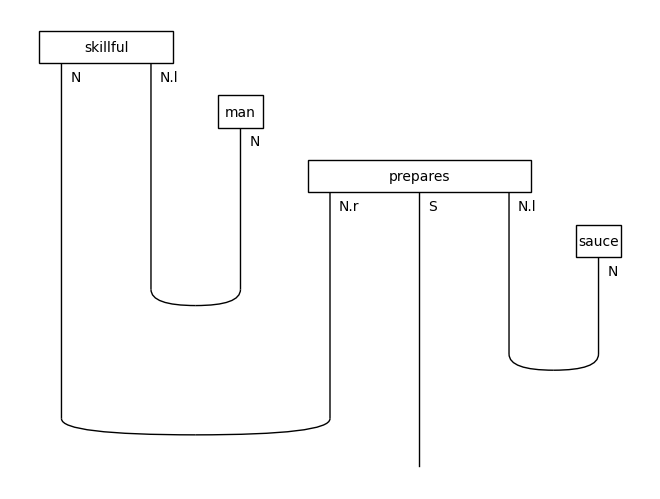

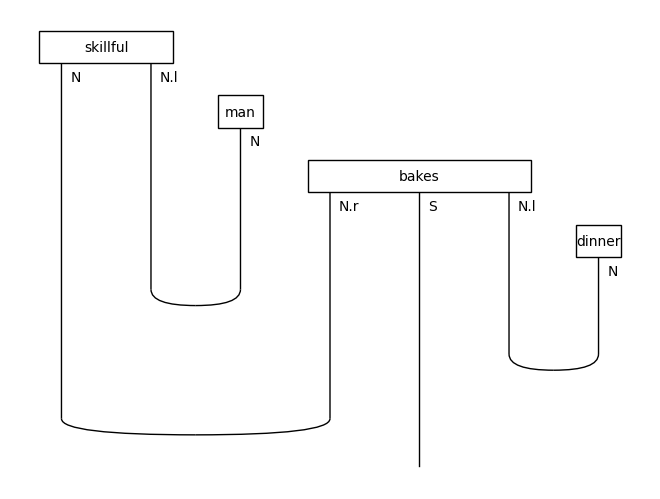

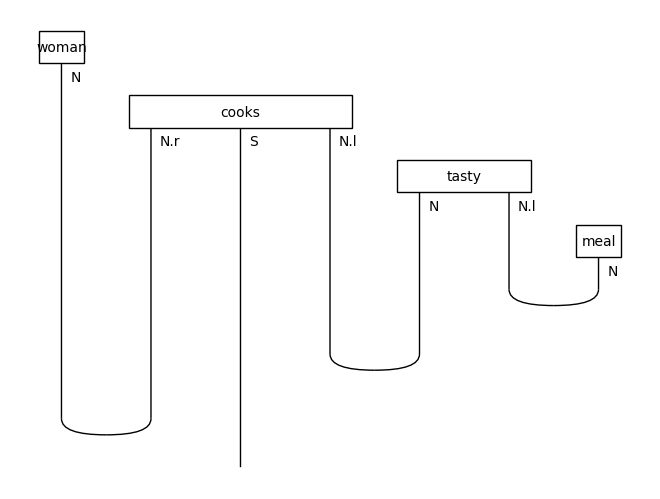

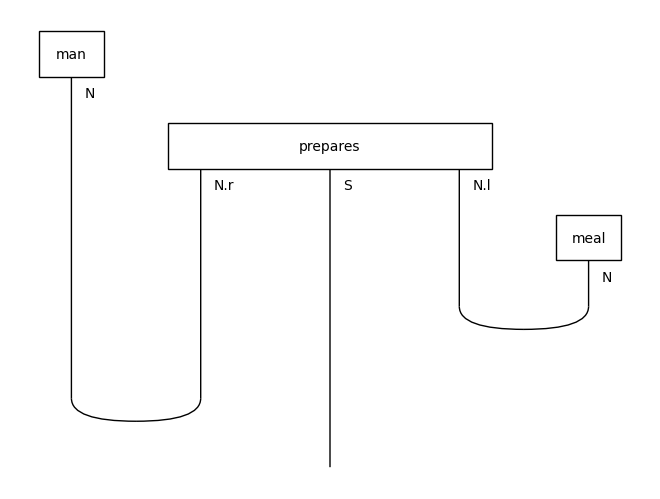

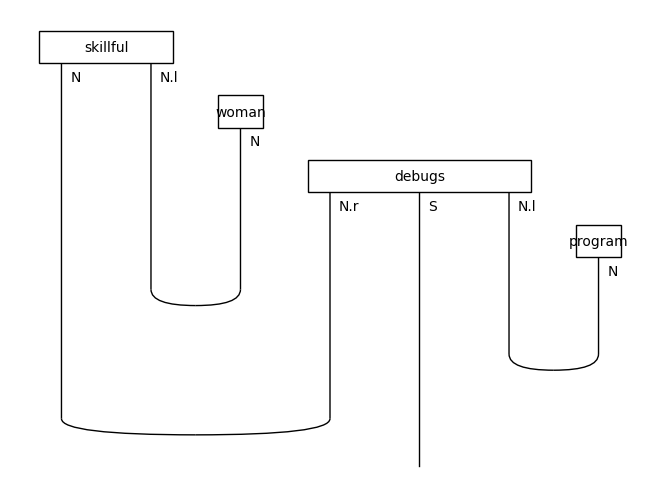

...

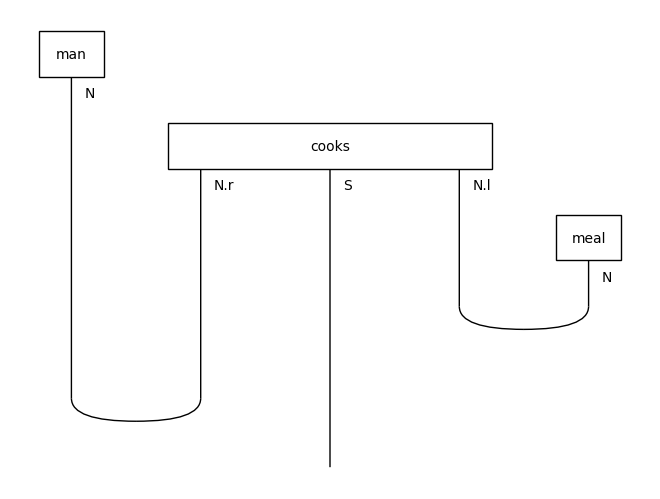

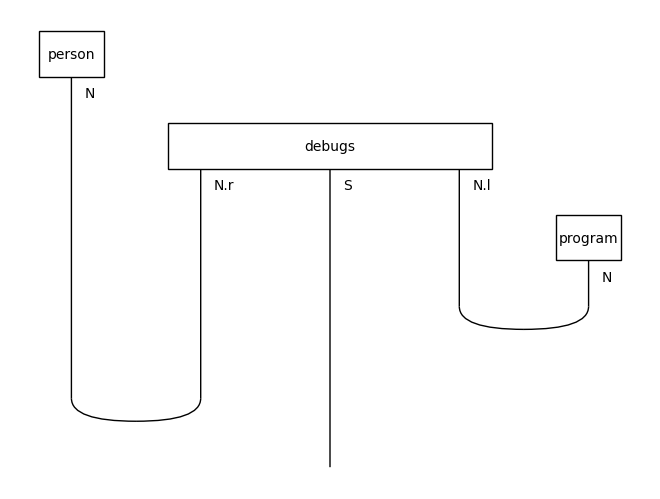

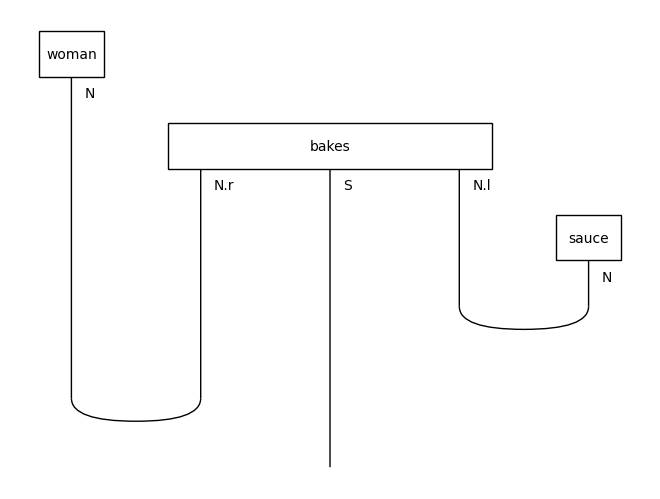

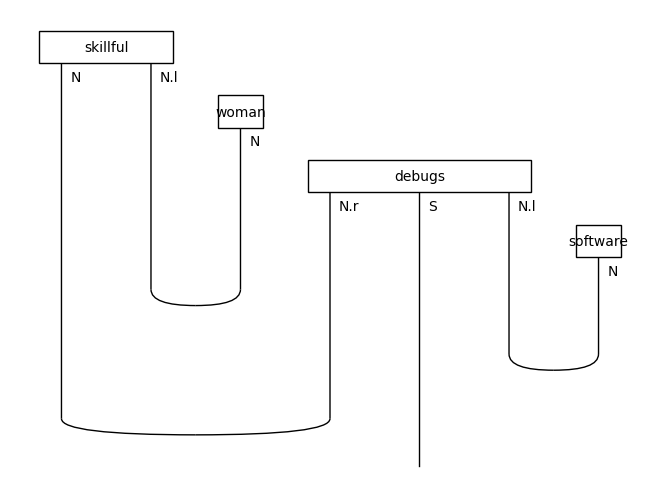

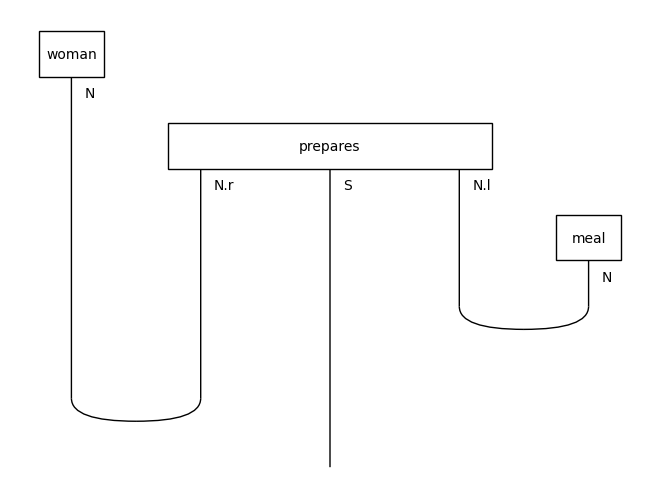

In [7]:
#******************************************************************************************************
# (Optional) For visualisation: Display the sentences as pregroup diagrams before reductions.
#******************************************************************************************************

for sentstr in sentences_pg_dict:
    sentences_pg_dict[sentstr][0].draw()

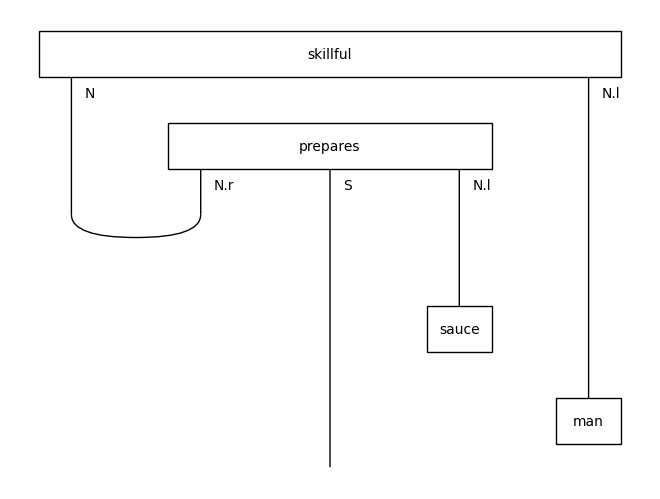

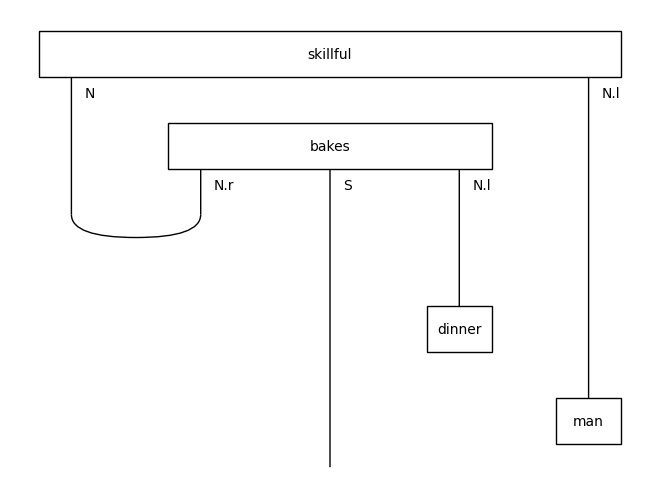

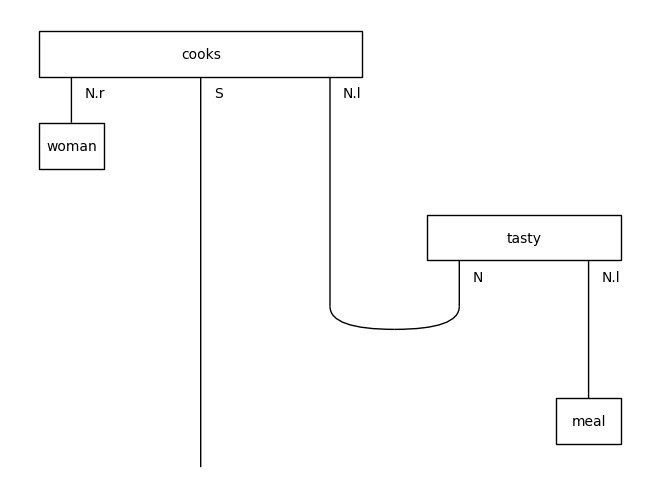

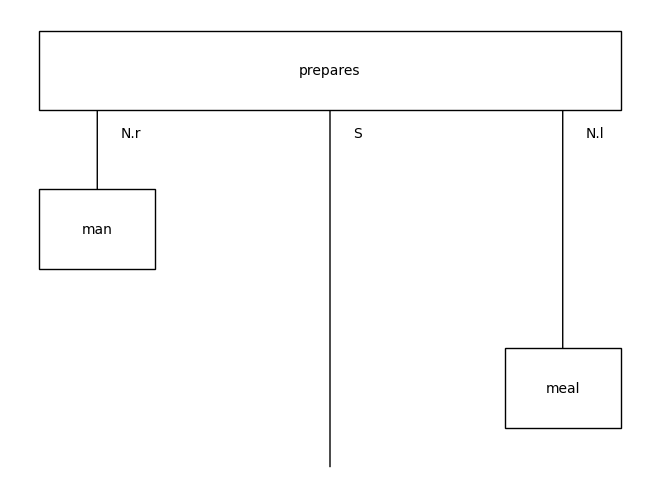

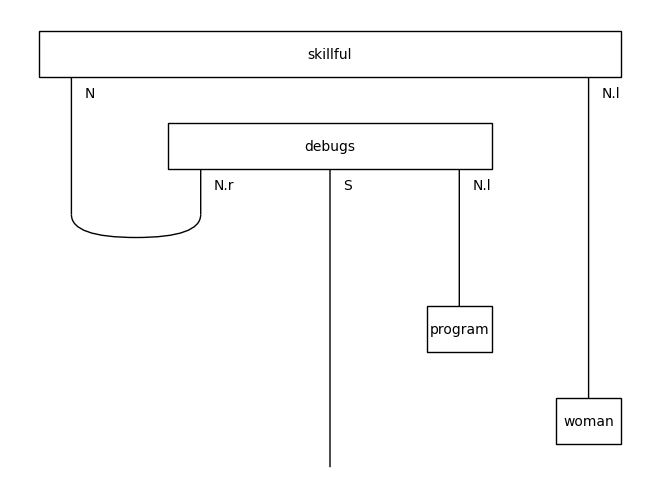

...

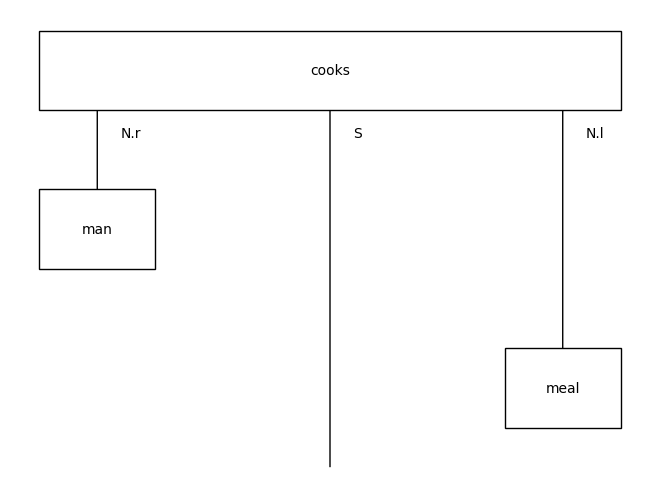

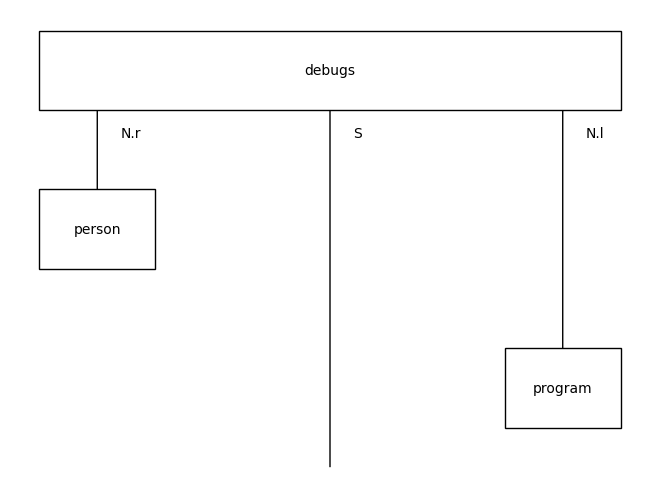

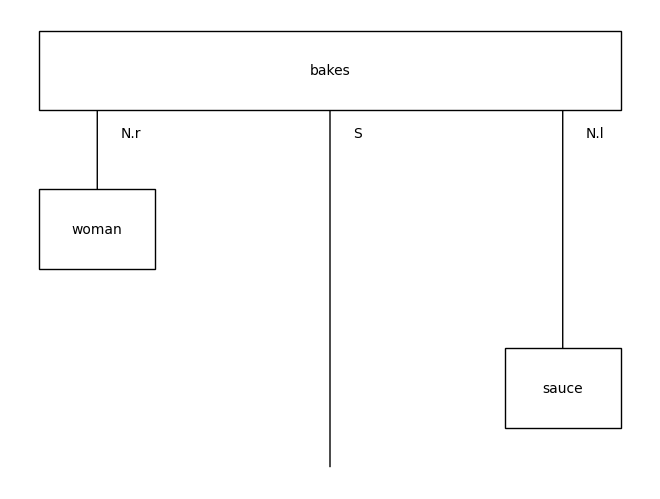

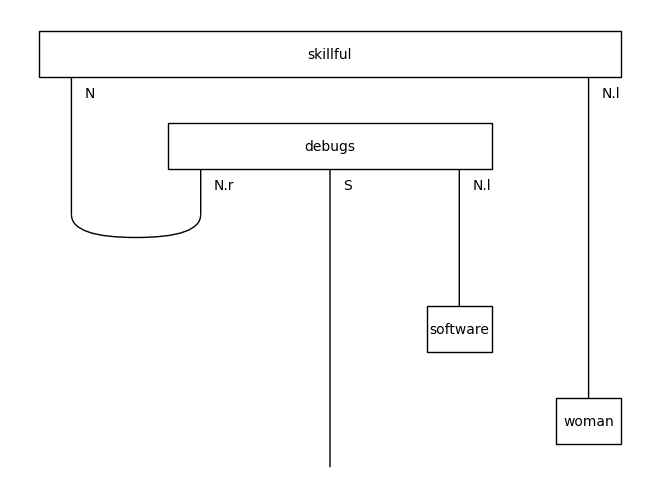

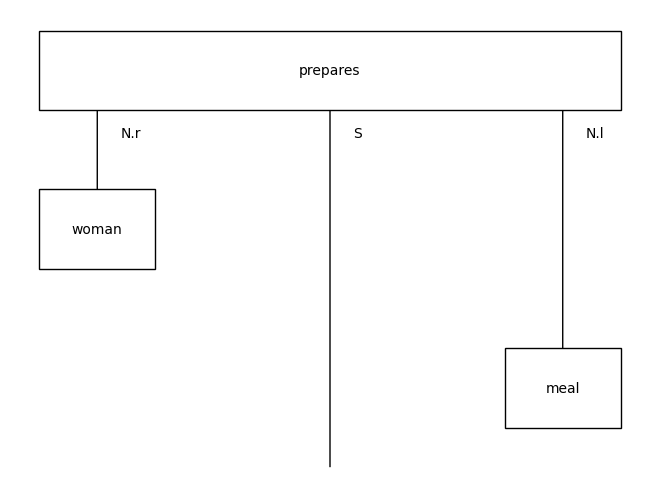

Number of parameters:     40


In [8]:
#******************************************************
# Bending the nouns around
#******************************************************
sentences_pg_psr_dict = dict()  # Dictionary for storing modified pregroup diagrams.

# Adjust sentence diagrams to "bend nouns around."
for sentstr in sentences_pg_dict:
    grammar_id = sentences_pg_dict[sentstr][1]  # Get the grammar structure of the sentence.
    num_words = len(grammar_id.split('_'))  # Number of words in the sentence.
    words = sentences_pg_dict[sentstr][0][:num_words].boxes  # Extract the words as boxes.
    grammar = sentences_pg_dict[sentstr][0][num_words:]  # Extract the grammatical structure.

    # Handle various grammatical structures by bending nouns appropriately.
    if grammar_id == 'N_TV_N':
        noun1 = Box(words[0].name, n.r, Ty())
        noun2 = Box(words[2].name, n.l, Ty())
        words_new = (Cap(n.r, n) @ Cap(n, n.l)) >> (noun1 @ Id(n) @ words[1] @ Id(n) @ noun2)
    if grammar_id == 'ADJ_N_TV_N':
        noun1 = Box(words[1].name, n.l, Ty())
        noun2 = Box(words[3].name, n.l, Ty())
        words_new = (Cap(n, n.l) @ Cap(n, n.l)) >> (words[0] @ Id(n) @ noun1 @ words[2] @ Id(n) @ noun2)
    if grammar_id == 'N_TV_ADJ_N':
        noun1 = Box(words[0].name, n.r, Ty())
        noun2 = Box(words[3].name, n.l, Ty())
        words_new = (Cap(n.r, n) @ Cap(n, n.l)) >> (noun1 @ Id(n) @ words[1] @ words[2] @ Id(n) @ noun2)
    if grammar_id == 'ADJ_N_TV_ADJ_N':
        noun1 = Box(words[1].name, n.l, Ty())
        noun2 = Box(words[4].name, n.l, Ty())
        words_new = (Cap(n, n.l) @ Cap(n, n.l)) >> (words[0] @ Id(n) @ noun1 @ words[2] @ words[3] @ Id(n) @ noun2)

    # Add the modified sentence diagram to the dictionary.
    sentence = words_new >> grammar
    sentences_pg_psr_dict.update({sentstr: sentence.normal_form()})

# Update vocabulary to reflect "bent nouns."
vocab_psr = []
for word in vocab_pg:
    if word.cod == Ty('N'):
        vocab_psr.append(Box(word.name, n.r, Ty()))  # Adjust nouns to right adjoint.
    else:
        vocab_psr.append(word)


#******************************************************************************************************
# (Optional) For visualisation: the sentences as pregroup diagrams -- after 'bending nouns around'
#******************************************************************************************************
for sentstr in sentences_pg_psr_dict:
    sentences_pg_psr_dict[sentstr].draw()


#*****************************************************
# Translation to quantum circuits
#*****************************************************
from discopy.quantum import Ket, IQPansatz, Bra
from discopy.quantum.gates import sqrt, H, CZ, Rz, Rx, CX
from discopy.quantum.circuit import Id
from discopy import CircuitFunctor
from discopy.quantum.circuit import Circuit as DCP_Circuit

# Assign qubit counts to grammatical types and prepare for circuit mappings.
ob = {s: q_s, n: q_n}                           # assignment of number of qubits to atomic grammatical types
ob_cqmap = {s: qubit ** q_s, n: qubit ** q_n}   # the form in which it is needed for discopy's cqmap module

# Define parameterized IQP ansatz for quantum circuits.
def single_qubit_iqp_ansatz(params):
    if len(params) == 1:
        return Rx(params[0])
    if len(params) == 2:
        return Rx(params[0]) >> Rz(params[1])
    if len(params) == 3:
        return IQPansatz(1, params)

def ansatz_state(state, params):
    arity = sum(ob[Ty(factor.name)] for factor in state.cod)
    if arity == 1:
        return Ket(0) >> single_qubit_iqp_ansatz(params)
    else:
        return Ket(*tuple([0 for i in range(arity)])) >> IQPansatz(arity, params)

def ansatz_effect(effect, params):
    arity = sum(ob[Ty(factor.name)] for factor in effect.dom)
    if arity == 1:
        return single_qubit_iqp_ansatz(params) >> Bra(0)
    else:
        return IQPansatz(arity, params) >> Bra(*tuple([0 for i in range(arity)]))

def ansatz(box,params):
    dom_type = box.dom
    cod_type = box.cod
    if len(dom_type) == 0 and len(cod_type) != 0:
        return ansatz_state(box, params)
    if len(dom_type) != 0 and len(cod_type) == 0:
        return ansatz_effect(box, params)

# Define a functor to map pregroup diagrams to quantum circuits.
def F(params):
    ar = dict()
    for i in range(len(vocab_psr)):
        pgbox = vocab_psr[i]
        qbox = ansatz(vocab_psr[i], params[i])
        ar.update({pgbox: qbox})
        if pgbox.cod == Ty():
            ar.update({Box(pgbox.name, n.l, Ty()): qbox})  # send the effect with n.l to same quantum effect
    return CircuitFunctor(ob_cqmap, ar)


# Define functions for parameter shapes and random initialization.
def paramshapes(vocab_psr):
    parshapes = []
    for box in vocab_psr:
        dom_type = box.dom
        cod_type = box.cod
        dom_arity = sum(ob[Ty(factor.name)] for factor in box.dom)
        cod_arity = sum(ob[Ty(factor.name)] for factor in box.cod)
        if dom_arity == 0 or cod_arity == 0:  # states and effects
            arity = max(dom_arity, cod_arity)
            assert arity != 0
            if arity == 1:
                parshapes.append((p_n,))
            if arity != 1:
                parshapes.append((depth, arity-1))
    return parshapes

def randparams(par_shapes):
    params = np.array([])
    for i in range(len(par_shapes)):
        params = np.concatenate((params, np.ravel(np.random.rand(*par_shapes[i]))))
    return params

def reshape_params(unshaped_pars, par_shapes):
    pars_reshaped = [[] for ii in range(len(par_shapes))]
    shift = 0
    for ss, s in enumerate(par_shapes):
        idx0 = 0 + shift
        if len(s) == 1:
            idx1 = s[0] + shift
        elif len(s) == 2:
            idx1 = s[0] * s[1] + shift
        pars_reshaped[ss] = np.reshape(unshaped_pars[idx0:idx1], s)
        if len(s) == 1:
            shift += s[0]
        elif len(s) == 2:
            shift += s[0] * s[1]
    return pars_reshaped

# Initialize parameters for the model.
par_shapes = paramshapes(vocab_psr)
rand_unshaped_pars = randparams(par_shapes)
rand_shaped_pars = reshape_params(rand_unshaped_pars, par_shapes)

print('Number of parameters:    ', len(rand_unshaped_pars))

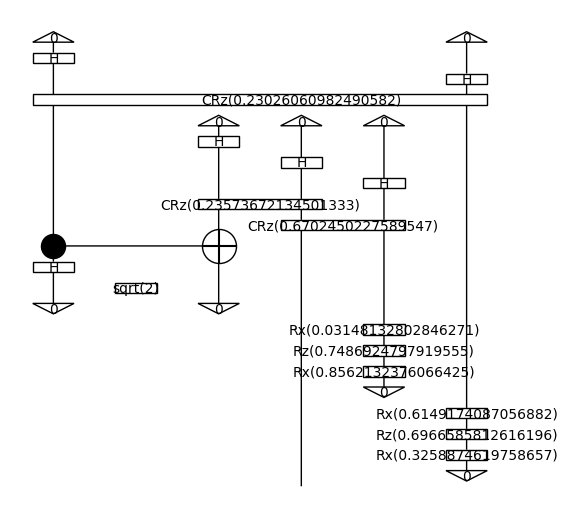

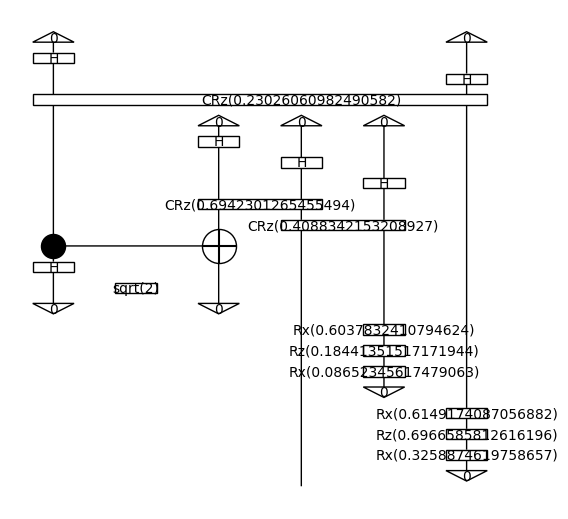

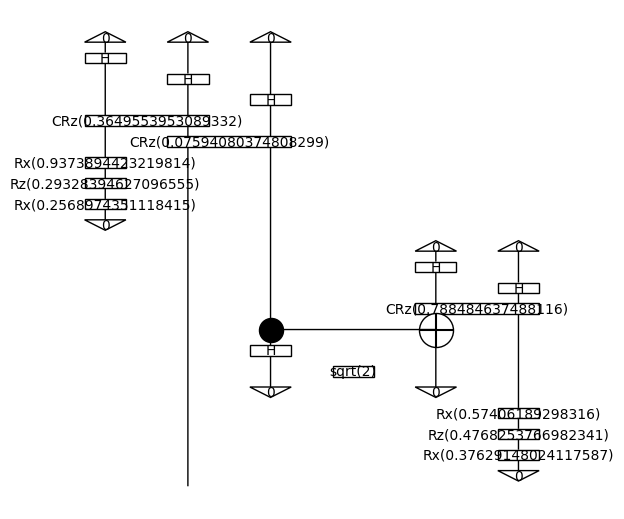

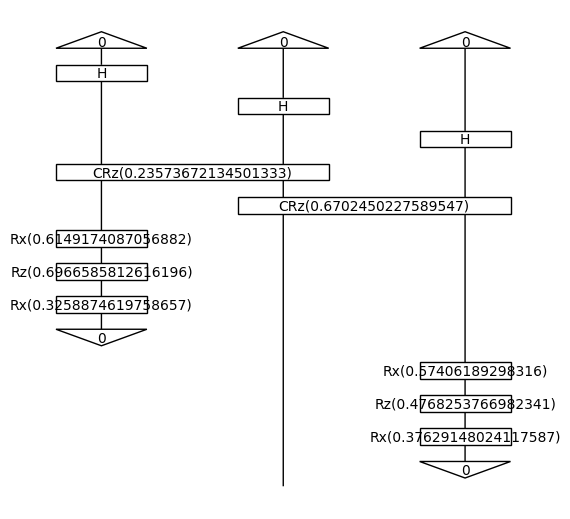

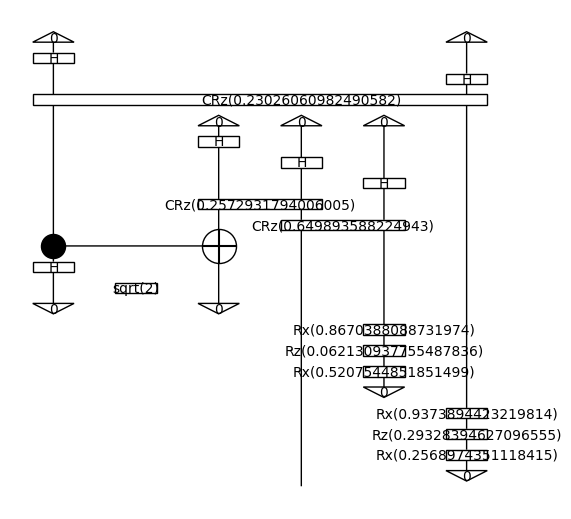

...

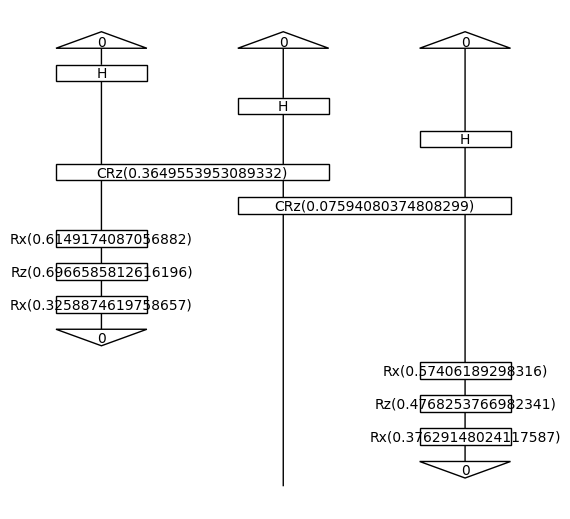

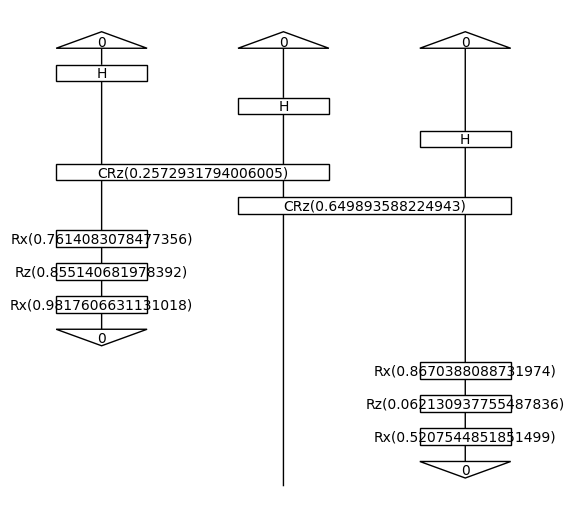

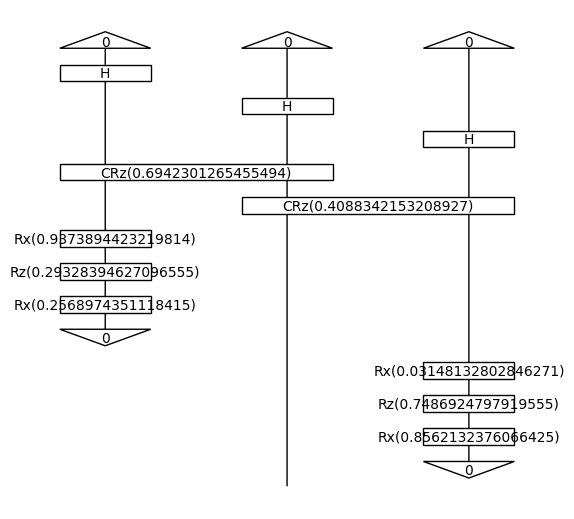

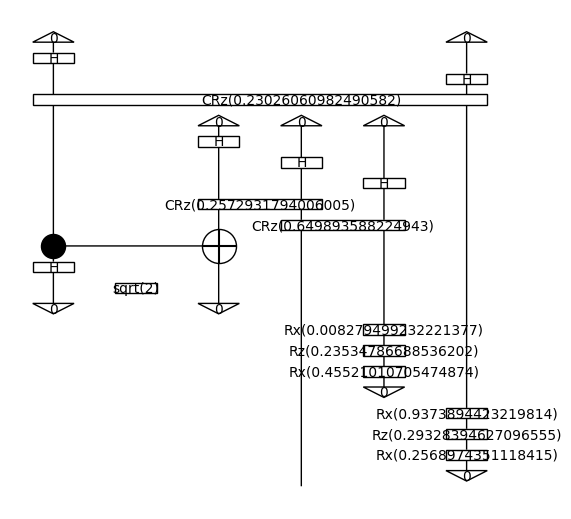

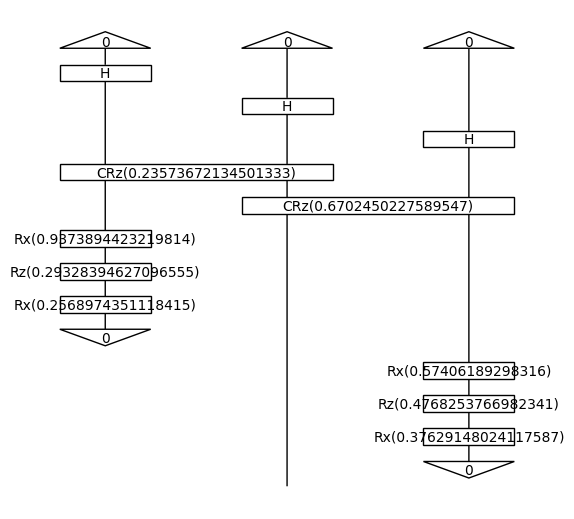

In [9]:
#**************************************************************
# (Optional) Quantum circuit diagrams for the sentences
#**************************************************************
func = F(rand_shaped_pars)

for sentstr in sentences_pg_psr_dict:
    func(sentences_pg_psr_dict[sentstr]).draw(draw_box_labels=True, figsize=(5, 5))

In [10]:
#********************************************************************************************
# Encode data for quantum computation, suitable for quantum hardware submissions.
#********************************************************************************************
train_labels = []  # List to store labels for the training dataset.
train_circuits_pg_psr = []  # List to store circuits for the training dataset.
for sentstr in training_data:  # Iterate over all sentences in the training data.
    train_circuits_pg_psr.append(sentences_pg_psr_dict[sentstr])  # Append the corresponding circuit for the sentence.
    train_labels.append(np.array(data[sentstr]))  # Append the label for the sentence as a numpy array.
train_labels = np.array(train_labels)  # Convert the list of training labels to a numpy array.

dev_labels = []
dev_circuits_pg_psr = []
for sentstr in dev_data:
    dev_circuits_pg_psr.append(sentences_pg_psr_dict[sentstr])
    dev_labels.append(np.array(data[sentstr]))
dev_labels = np.array(dev_labels)

test_labels = []
test_circuits_pg_psr = []
for sentstr in testing_data:
    test_circuits_pg_psr.append(sentences_pg_psr_dict[sentstr])
    test_labels.append(np.array(data[sentstr]))
test_labels = np.array(test_labels)




---



**<h2>AerBackend Code</h2>**

---





In [11]:
#**********************************************************************************
# Split cost and error functions for time efficiency
#**********************************************************************************

def get_probs(unshaped_params):  # Calculate predicted label distributions for the training data.
    func = F(reshape_params(unshaped_params, par_shapes))  # Convert unshaped parameters into a quantum circuit functor.
    train_circuits = [(func(circ) >> Measure()) for circ in train_circuits_pg_psr]  # Attach measurements to all circuits.
    results = []
    for circuit in train_circuits:  # Evaluate each circuit on the quantum backend.
        result = circuit.eval(
            backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2)
        )
        results.append(result)  # Store the results.
    results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in results]  # Fix numerical issues for probabilities.
    pred_labels_distrs = [res / np.sum(res) for res in results_tweaked]  # Normalize results to get probability distributions.
    print(pred_labels_distrs)  # Debug: print distributions.
    print(len(pred_labels_distrs[0]))  # Debug: print the number of labels per distribution.
    return pred_labels_distrs  # Return the list of probability distributions.

def get_cost(pred_labels_distrs):  # Calculate the cross-entropy cost for training predictions.
    cross_entropies = np.array([
        np.sum(train_labels[s] * np.log2(pred_labels_distrs[s])) for s in range(len(train_labels))
    ])  # Compute the cross-entropy for each training example.
    return -1 / len(training_data) * np.sum(cross_entropies)  # Average and return the negative cross-entropy.

def get_train_error(pred_labels_distrs):  # Calculate the training error.
    error = 0.0
    assert len(pred_labels_distrs[0]) == 2  # Ensure binary labels.
    pred_labels = [np.round(res) for res in pred_labels_distrs]  # Round predictions to 0 or 1.
    for i in range(len(pred_labels)):  # Compare predictions with true labels.
        if np.sum(pred_labels[i]) != 1.0:  # If prediction is invalid (e.g., [1, 1]).
            error += 1
        else:
            error += np.abs(train_labels[i][0] - pred_labels[i][0])  # Check for mismatches in labels.
    return round(error * 100 / len(training_data), 1)  # Return error as a percentage.

def get_dev_error(unshaped_params):  # Calculate the error on the development dataset.
    func = F(reshape_params(unshaped_params, par_shapes))  # Convert parameters to a quantum circuit functor.
    dev_circuits = [(func(circ) >> Measure()) for circ in dev_circuits_pg_psr]  # Add measurements to dev circuits.
    results = DCP_Circuit.eval(
        *dev_circuits, backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2)
    )  # Evaluate circuits in batch mode for efficiency.
    results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in results]  # Normalize probabilities.
    assert len(results_tweaked[0]) == 2  # Ensure binary labels.
    pred_labels = [np.round(res / np.sum(res)) for res in results_tweaked]  # Normalize and round probabilities.
    error = 0.0
    for i in range(len(pred_labels)):  # Compare predictions with true labels.
        if np.sum(pred_labels[i]) != 1.0:  # If prediction is invalid.
            error += 1
        else:
            error += np.abs(dev_labels[i][0] - pred_labels[i][0])  # Check for mismatches.
    error = round(error * 100 / len(dev_data), 1)  # Return error as a percentage.
    return error, pred_labels  # Return error and predictions.

def get_test_error(unshaped_params):  # Calculate the error on the test dataset.
    func = F(reshape_params(unshaped_params, par_shapes))  # Convert parameters to a quantum circuit functor.
    test_circuits = [(func(circ) >> Measure()) for circ in test_circuits_pg_psr]  # Add measurements to test circuits.
    results = []
    for circuit in test_circuits:  # Evaluate each circuit on the quantum backend.
        result = circuit.eval(
            backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2)
        )
        results.append(result)  # Store results.
    results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in results]  # Normalize probabilities.
    print(len(results_tweaked[0]))  # Debug: print the number of labels per distribution.
    print(results_tweaked)  # Debug: print raw tweaked results.

    assert len(results_tweaked[0]) == 2  # Ensure binary labels.
    pred_labels = [np.round(res / np.sum(res)) for res in results_tweaked]  # Normalize and round probabilities.
    error = 0.0
    for i in range(len(pred_labels)):  # Compare predictions with true labels.
        if np.sum(pred_labels[i]) != 1.0:  # If prediction is invalid.
            error += 1
        else:
            error += np.abs(test_labels[i][0] - pred_labels[i][0])  # Check for mismatches.
    error = round(error * 100 / len(testing_data), 1)  # Return error as a percentage.
    return error, pred_labels  # Return error and predictions.

In [12]:
#**********************************************************************************
# Minimization algorithm: Standard SPSA
#**********************************************************************************

# This is a modified version of the minimizeSPSA function from the noisyopt package.
# It is adjusted to work with the quantum training setup and tailored to this experiment.

def my_spsa(get_probs, get_cost, get_train_error, get_test_error, x0,
            bounds=None, niter=100, a=1.0, c=1.0, alpha=0.602, gamma=0.101,
            print_iter=False, correct_func_value=True,
            filename='spsa_output', iters_selected=[]):
    A = 0.01 * niter  # Scaling parameter to control step size.
    N = len(x0)  # Number of parameters to optimize.
    if bounds is None:  # If no bounds are provided, use identity projection.
        project = lambda x: x
    else:  # Otherwise, clip the parameter values to stay within bounds.
        bounds = np.asarray(bounds)
        project = lambda x: np.clip(x, bounds[:, 0], bounds[:, 1])

    # Initialize histories to store optimization progress.
    param_history = []  # Track parameter values at each step.
    func_history = []  # Track cost function values.
    error_history = []  # Track training error values.
    pred_label_history = []  # Track predicted labels.
    pred_labels_test_error = dict()  # Store predicted labels for selected test iterations.
    test_error_list = []  # Track test errors for selected iterations.
    x = x0  # Initialize parameters with the starting point.

    # Loop through iterations of the optimization.
    for k in range(niter):
        if print_iter:
            print('-------------', '\n', 'iteration: ', k, sep='')  # Print iteration number.
        start = time()  # Start timing the iteration.

        # Determine step size and perturbation magnitude.
        ak = a / (k + 1.0 + A) ** alpha  # Learning rate schedule.
        ck = c / (k + 1.0) ** gamma  # Perturbation scale.
        delta = np.random.choice([-1, 1], size=N)  # Generate random perturbation direction.

        # Move in the positive direction.
        xplus = project(x + ck * delta)  # Perturb parameters positively.
        if print_iter:
            print('Call for xplus')  # Debugging: indicate evaluation for xplus.
        results_tweaked_plus = get_probs(xplus)  # Evaluate probabilities for perturbed parameters.
        funcplus = get_cost(results_tweaked_plus)  # Compute the cost at xplus.

        # Move in the negative direction.
        xminus = project(x - ck * delta)  # Perturb parameters negatively.
        if print_iter:
            print('Call for xminus')  # Debugging: indicate evaluation for xminus.
        results_tweaked_minus = get_probs(xminus)  # Evaluate probabilities for perturbed parameters.
        funcminus = get_cost(results_tweaked_minus)  # Compute the cost at xminus.

        # Compute gradient approximation and update parameters.
        grad = (funcplus - funcminus) / (xplus - xminus)  # Approximate the gradient using finite differences.
        x = project(x - ak * grad)  # Update parameters with projected gradient descent.
        param_history.append(x)  # Store updated parameters.

        # Evaluate cost and error at current parameters.
        if correct_func_value or k == (niter - 1):  # Recompute cost at current parameters if needed.
            if print_iter:
                print('Call for current_func_value')  # Debugging: indicate evaluation for current function value.
            results_tweaked = get_probs(x)  # Get probabilities for current parameters.
            current_func_value = get_cost(results_tweaked)  # Compute current cost.
            error = get_train_error(results_tweaked)  # Compute current training error.
            pred_label_history.append(results_tweaked)  # Save current predicted labels.
        else:  # Otherwise, use the cost and labels from the positive direction.
            current_func_value = funcplus
            error = get_train_error(results_tweaked_plus)
            pred_label_history.append(results_tweaked_plus)

        # Calculate test error for selected iterations.
        if k in iters_selected:
            print('Calculate test error for iteration:', k)  # Debugging: indicate test error calculation.
            res = get_test_error(x)  # Compute test error at current parameters.
            test_error_list.append(res[0])  # Save test error.
            pred_labels_test_error.update({k: res[1]})  # Save predicted labels for the test set.

        # Record current cost and error.
        func_history.append(current_func_value)
        error_history.append(error)

        # Save optimization progress to a file for later analysis.
        dump_data = {
            'param_history': param_history,
            'func_history': func_history,
            'error_history': error_history,
            'predlabel_history': pred_label_history,
            'iters_selected': iters_selected,
            'test_error_list': test_error_list,
            'pred_labels_test_error': pred_labels_test_error
        }
        with open(filename + '.pickle', 'wb') as file_handle:
            pickle.dump(dump_data, file_handle)  # Save progress in a pickle file.

        if print_iter:
            print('Time taken for this iteration: ', time() - start)  # Print time taken for the iteration.

    # Return the recorded histories.
    return param_history, func_history, error_history, test_error_list


In [13]:
#**********************************************************************************
# Minimization algorithm: Enhanced SPSA
#**********************************************************************************

def my_spsa_opt(get_probs, get_cost, get_train_error, get_test_error, x0,
                bounds=None, niter=100, a=1.0, c=1.0, alpha=0.602, gamma=0.101,
                print_iter=False, correct_func_value=True,
                filename='spsa_output', iters_selected=[], tolerance=1e-6):
    A = 0.01 * niter  # Scaling parameter to adjust the step size.
    N = len(x0)  # Number of parameters to optimize.

    # Define the parameter projection function based on bounds.
    if bounds is None:  # If no bounds are provided, no projection is applied.
        project = lambda x: x
    else:  # If bounds are provided, ensure parameters remain within the specified limits.
        bounds = np.asarray(bounds)
        project = lambda x: np.clip(x, bounds[:, 0], bounds[:, 1])

    # Initialize histories to track optimization progress.
    param_history = []  # Store parameter values at each iteration.
    func_history = []  # Store function (cost) values.
    error_history = []  # Store training errors.
    pred_label_history = []  # Store predicted labels.
    pred_labels_test_error = dict()  # Store test predictions for selected iterations.
    test_error_list = []  # Store test errors for selected iterations.
    x = np.array(x0)  # Initialize parameters with the starting point.

    # Loop through iterations of the optimization.
    for k in range(niter):
        if print_iter:
            print(f'-------------\nIteration: {k}')  # Print the current iteration number.
        start = time()  # Start timing the iteration.

        # Calculate step size and perturbation scale.
        ak = a / (k + 1.0 + A) ** alpha  # Adjust step size with iteration count.
        ck = c / (k + 1.0) ** gamma  # Adjust perturbation scale with iteration count.

        # Generate random perturbation directions for all parameters.
        delta = np.random.choice([-1, 1], size=N)

        # Evaluate the cost function at x + delta.
        xplus = project(x + ck * delta)  # Perturb parameters positively.
        results_tweaked_plus = get_probs(xplus)  # Get probabilities for perturbed parameters.
        funcplus = get_cost(results_tweaked_plus)  # Compute the cost at xplus.

        # Evaluate the cost function at x - delta.
        xminus = project(x - ck * delta)  # Perturb parameters negatively.
        results_tweaked_minus = get_probs(xminus)  # Get probabilities for perturbed parameters.
        funcminus = get_cost(results_tweaked_minus)  # Compute the cost at xminus.

        # Approximate the gradient using finite differences.
        grad = (funcplus - funcminus) / (xplus - xminus)

        # Update parameters using the gradient.
        x = project(x - ak * grad)  # Perform gradient descent step and project parameters into bounds.
        param_history.append(x)  # Store the updated parameters.

        # Evaluate cost and error for the current parameters.
        if correct_func_value or k == (niter - 1):  # Recompute cost if required or at the last step.
            results_tweaked = get_probs(x)  # Get probabilities for current parameters.
            current_func_value = get_cost(results_tweaked)  # Compute current cost.
            error = get_train_error(results_tweaked)  # Compute training error.
            pred_label_history.append(results_tweaked)  # Store predicted labels for current parameters.
        else:  # Use the cost from the positive perturbation if not recomputing.
            current_func_value = funcplus
            error = get_train_error(results_tweaked_plus)
            pred_label_history.append(results_tweaked_plus)

        # Compute test error for selected iterations.
        if k in iters_selected:
            print('Calculate test error for iteration:', k)  # Indicate test error calculation.
            res = get_test_error(x)  # Compute test error.
            test_error_list.append(res[0])  # Store test error.
            pred_labels_test_error.update({k: res[1]})  # Store test predictions.

        func_history.append(current_func_value)  # Record the current cost.
        error_history.append(error)  # Record the current training error.

        # Save optimization progress periodically or at the last iteration.
        if (k % 10 == 0 or k == niter - 1):  # Save every 10 iterations or at the end.
            dump_data = {
                'param_history': param_history,
                'func_history': func_history,
                'error_history': error_history,
                'pred_label_history': pred_label_history,
                'iters_selected': iters_selected,
                'test_error_list': test_error_list,
                'pred_labels_test_error': pred_labels_test_error
            }
            with open(filename + '.pickle', 'wb') as file_handle:
                pickle.dump(dump_data, file_handle)  # Save optimization data to a file.

        # Print the time taken for the current iteration.
        if print_iter:
            print(f"Time taken for this iteration: {time() - start:.4f} seconds")

        # Check for convergence based on the change in cost function value.
        if k > 0 and abs(func_history[-1] - func_history[-2]) < tolerance:
            print(f"Converged at iteration {k}.")  # Stop if the change in cost is below the tolerance threshold.
            break

    # Return the recorded histories for analysis.
    return param_history, func_history, error_history, test_error_list

In [14]:
#**********************************************************************************
# Minimization algorithm: Adam Optimization Algorithm
#**********************************************************************************

def my_adam(get_probs, get_cost, get_train_error, get_test_error, x0,
            bounds=None, niter=100, alpha=0.001, beta1=0.9, beta2=0.999, epsilon=1e-8,
            print_iter=False, filename='adam_output', iters_selected=[], tolerance=1e-6):
    N = len(x0)  # Number of parameters to optimize.
    if bounds is None:  # If no bounds are provided, parameters are unbounded.
        project = lambda x: x
    else:  # If bounds are provided, clip parameter values within bounds.
        bounds = np.asarray(bounds)
        project = lambda x: np.clip(x, bounds[:, 0], bounds[:, 1])

    # Initialization
    param_history = []  # Store parameter values at each iteration.
    func_history = []  # Store function (cost) values.
    error_history = []  # Store training error values.
    pred_label_history = []  # Store predicted label distributions.
    test_error_list = []  # Store test error values for selected iterations.
    pred_labels_test_error = {}  # Store test predicted labels for selected iterations.
    m = np.zeros(N)  # First moment vector (mean of gradients).
    v = np.zeros(N)  # Second moment vector (variance of gradients).
    x = np.array(x0)  # Initialize parameters with the starting point.

    # ADAM update loop
    for k in range(1, niter + 1):  # Loop over the number of iterations.
        if print_iter:
            print('-------------', '\n', 'Iteration:', k, sep='')  # Print iteration number.
        start = time()  # Start timing the iteration.

        # Compute gradient using central difference method.
        grad = np.zeros(N)  # Initialize gradient vector.
        delta = 1e-5  # Small perturbation for finite difference approximation.
        for i in range(N):  # Loop through each parameter.
            x_plus = x.copy()  # Perturb parameter positively.
            x_plus[i] += delta
            x_minus = x.copy()  # Perturb parameter negatively.
            x_minus[i] -= delta

            results_tweaked_plus = get_probs(x_plus)  # Evaluate probabilities for x_plus.
            results_tweaked_minus = get_probs(x_minus)  # Evaluate probabilities for x_minus.
            funcplus = get_cost(results_tweaked_plus)  # Compute cost at x_plus.
            funcminus = get_cost(results_tweaked_minus)  # Compute cost at x_minus.

            grad[i] = (funcplus - funcminus) / (2 * delta)  # Estimate gradient for parameter i.

        # Update first and second moment vectors.
        m = beta1 * m + (1 - beta1) * grad  # Update moving average of gradients (mean).
        v = beta2 * v + (1 - beta2) * (grad ** 2)  # Update moving average of squared gradients (variance).

        # Apply bias correction to moments.
        m_hat = m / (1 - beta1 ** k)  # Corrected first moment estimate.
        v_hat = v / (1 - beta2 ** k)  # Corrected second moment estimate.

        # Update parameters using Adam formula.
        x = project(x - alpha * m_hat / (np.sqrt(v_hat) + epsilon))  # Update parameters and apply bounds.
        param_history.append(x)  # Store updated parameters.

        # Evaluate current cost and training error.
        results_tweaked = get_probs(x)  # Get predicted probabilities for current parameters.
        current_func_value = get_cost(results_tweaked)  # Compute current cost.
        error = get_train_error(results_tweaked)  # Compute current training error.
        func_history.append(current_func_value)  # Store cost history.
        error_history.append(error)  # Store training error history.
        pred_label_history.append(results_tweaked)  # Store predicted labels.

        # Calculate test error for selected iterations.
        if k in iters_selected:
            print('Calculating test error for iteration:', k)  # Debugging: indicate test error calculation.
            res = get_test_error(x)  # Compute test error.
            test_error_list.append(res[0])  # Store test error.
            pred_labels_test_error.update({k: res[1]})  # Store predicted labels for test set.

        # Save progress periodically or at the end.
        if (k % 10 == 0 or k == niter):  # Save every 10 iterations or at the final iteration.
            dump_data = {
                'param_history': param_history,
                'func_history': func_history,
                'error_history': error_history,
                'pred_label_history': pred_label_history,
                'iters_selected': iters_selected,
                'test_error_list': test_error_list,
                'pred_labels_test_error': pred_labels_test_error
            }
            with open(filename + '.pickle', 'wb') as file_handle:
                pickle.dump(dump_data, file_handle)  # Save data to file.

        # Print time taken for the iteration.
        if print_iter:
            print(f'Time taken for this iteration: {time() - start:.4f} seconds')

        # Convergence check based on the change in cost function value.
        if k > 1 and abs(func_history[-1] - func_history[-2]) < tolerance:
            print(f'Converged at iteration {k}.')  # Stop if change in cost is below the tolerance threshold.
            break

    # Return recorded histories for analysis.
    return param_history, func_history, error_history, test_error_list

In [15]:
#**********************************************************************************
# Auxilary Methods: Genetic Algorithm
#**********************************************************************************

# Create an initial population of individuals with random parameter values between 0 and 1.
# pop_size` is the number of individuals, and `n_params` is the number of parameters for each individual.
def initialize_population(pop_size, n_params):
    return np.random.rand(pop_size, n_params)

# Evaluate the population by computing costs and errors for all individuals.
def evaluate_population(population, get_cost, get_train_error):
    # Calculate the cost for each individual in the population.
    costs = np.array([get_cost(ind) for ind in population])
    # Calculate the training error for each individual.
    errors = np.array([get_train_error(ind) for ind in population])
    return costs, errors

# Perform tournament selection to pick parents based on cost (lower is better).
def select_parents(population, costs):
    pop_size = len(population)  # Get the size of the population.
    parents = np.empty_like(population)  # Initialize an array to store the selected parents.
    for i in range(pop_size):  # Select a parent for each individual.
        # Randomly select two individuals.
        tournament_indices = np.random.choice(pop_size, size=2, replace=False)
        # Choose the individual with the lower cost.
        winner = tournament_indices[np.argmin(costs[tournament_indices])]
        parents[i] = population[winner]  # Add the winner to the parents array.
    return parents

# Perform crossover to combine genes of parent pairs and create new offspring.
def crossover(parents, crossover_rate=0.8):
    offspring = np.empty_like(parents)  # Initialize an array for offspring.
    for i in range(0, len(parents), 2):  # Iterate through pairs of parents.
        # Check if crossover occurs.
        if i + 1 < len(parents) and np.random.rand() < crossover_rate:
            crossover_point = np.random.randint(1, len(parents[0]))  # Choose a random crossover point.
            # Exchange genes before and after the crossover point between two parents.
            offspring[i, :crossover_point] = parents[i, :crossover_point]
            offspring[i, crossover_point:] = parents[i + 1, crossover_point:]
            offspring[i + 1, :crossover_point] = parents[i + 1, :crossover_point]
            offspring[i + 1, crossover_point:] = parents[i, crossover_point:]
        else:  # If no crossover occurs, copy the parents directly to the offspring.
            offspring[i] = parents[i]
            if i + 1 < len(parents):  # Handle the last individual in odd-sized populations.
                offspring[i + 1] = parents[i + 1]
    return offspring

# Apply random mutations to individuals in the offspring with a given mutation rate.
def mutate(offspring, mutation_rate=0.1):
    for ind in offspring:  # Iterate through each individual in the offspring.
        # Check if mutation occurs for the individual.
        if np.random.rand() < mutation_rate:
            # Generate a mutation vector from a normal distribution.
            mutation_vector = np.random.normal(0, 0.1, size=len(ind))
            # Add the mutation vector to the individual's genes.
            ind += mutation_vector
            # Ensure parameter values remain within the valid range [0, 1].
            ind = np.clip(ind, 0, 1)
    return offspring

In [16]:
#**********************************************************************************
# Minimization algorithm: Genetic Algorithm
#**********************************************************************************

def genetic_algorithm(get_probs, get_cost, get_train_error, get_test_error, x0,
                     pop_size=10, niter=20,
                     crossover_rate=0.8, mutation_rate=0.1,
                     filename='ga_output', iters_selected=[], correct_func_value=True, tolerance=1e-6):
    n_params = len(x0)  # Number of parameters to optimize.
    population = initialize_population(pop_size, n_params)  # Initialize a random population of solutions.

    # Histories for tracking progress.
    param_history = []  # Track the best solution's parameters over iterations.
    func_history = []  # Track the best solution's cost over iterations.
    error_history = []  # Track the training error of the best solution.
    pred_label_history = []  # Track predicted label distributions of the best solution.
    test_error_list = []  # Track test errors for selected iterations.
    pred_labels_test_error = {}  # Track test predictions for selected iterations.

    best_cost = np.inf  # Initialize the best cost to infinity.
    best_solution = None  # Initialize the best solution.

    for k in range(niter):  # Loop through iterations.
        start = time()  # Start timing the iteration.

        # Evaluate the population.
        predictions = [get_probs(ind) for ind in population]  # Get predictions for each individual.
        costs = np.array([get_cost(pred) for pred in predictions])  # Compute costs for all individuals.
        errors = np.array([get_train_error(pred) for pred in predictions])  # Compute training errors for all individuals.

        # Track the best solution in the current generation.
        best_index = np.argmin(costs)  # Identify the individual with the lowest cost.
        if costs[best_index] < best_cost:  # Update the best solution if a better one is found.
            best_cost = costs[best_index]
            best_solution = population[best_index]

        param_history.append(population[best_index])  # Record the best solution's parameters.
        func_history.append(costs[best_index])  # Record the best solution's cost.
        error_history.append(errors[best_index])  # Record the best solution's training error.
        pred_label_history.append(predictions[best_index])  # Record the best solution's predictions.

        # Optionally evaluate test error for selected iterations.
        if k in iters_selected:
            print(f'Calculating test error for iteration: {k}')
            test_error_result = get_test_error(population[best_index])  # Evaluate test error for the best solution.
            test_error_list.append(test_error_result[0])  # Record the test error.
            pred_labels_test_error[k] = test_error_result[1]  # Record the test predictions.

        # Selection, Crossover, and Mutation.
        parents = select_parents(population, costs)  # Select parents based on fitness (low cost).
        offspring = crossover(parents, crossover_rate)  # Perform crossover to produce offspring.
        population = mutate(offspring, mutation_rate)  # Apply random mutations to the offspring.

        # Optional correction of the cost function value for the best individual.
        if correct_func_value or k == (niter - 1):
            best_prediction = get_probs(population[best_index])  # Recompute predictions for the best solution.
            current_func_value = get_cost(best_prediction)  # Recompute cost for the best solution.
            error = get_train_error(best_prediction)  # Recompute training error for the best solution.
            pred_label_history[-1] = best_prediction  # Update the prediction history for the best solution.
        else:
            current_func_value = costs[best_index]  # Use previously computed cost.
            error = errors[best_index]  # Use previously computed error.

        # Save results to a file.
        dump_data = {
            'param_history': param_history,
            'func_history': func_history,
            'error_history': error_history,
            'pred_label_history': pred_label_history,
            'iters_selected': iters_selected,
            'test_error_list': test_error_list,
            'pred_labels_test_error': pred_labels_test_error
        }
        with open(filename + '.pickle', 'wb') as file_handle:
            pickle.dump(dump_data, file_handle)  # Save optimization data to a file.

        # Print iteration details.
        print(f"Iteration: {k}, Best Cost: {current_func_value}, Time taken: {time() - start:.4f} seconds")

        # Convergence check based on the improvement in the best cost.
        if k > 0 and abs(func_history[-1] - func_history[-2]) < tolerance:
            print(f"Converged at iteration {k}.")
            break

    # Return the histories for analysis.
    return param_history, func_history, error_history, test_error_list

In [17]:
# Import Circuit for quantum-related operations.
from discopy.quantum.circuit import Circuit

In [18]:
#************************************
# Quantum run: Standard SPSA training and error calculation
#************************************

# Define parameter bounds for optimization.
bounds = [[0.0, 1.0] for ii in range(len(rand_unshaped_pars))]  # Set each parameter's range to [0, 1].

# Set SPSA-specific optimization constants.
c_fix = 0.1  # Perturbation magnitude for the SPSA algorithm.
a_est = 0.015  # Step size scaling factor for the SPSA algorithm.

# Initialize data structures to store results from multiple runs.
res = []  # Store results from the SPSA algorithm.
param_histories_spsa = []  # Store parameter histories for each run.
cost_histories_spsa = np.zeros((n_runs, niter))  # Array to track cost function values across iterations.
error_train_histories_spsa = np.zeros((n_runs, niter))  # Array to track training errors across iterations.

# Select specific iterations for test error evaluation to save time.
iters_selected = [(i + 1) * 10 - 1 for i in range(int(niter / 10))]  # Choose every 10th iteration.
iters_selected.insert(0, 0)  # Include the 0th iteration as well.
error_test_histories_spsa = np.zeros((n_runs, len(iters_selected)))  # Track test errors for selected iterations.

# Run the optimization multiple times (n_runs).
for i in range(n_runs):
    print('---------------------------------')
    print('Start run ', i + 1)  # Indicate the start of a new run.

    # Randomly initialize parameters for the current run.
    rand_unshaped_pars = randparams(par_shapes)
    start = time()  # Record the start time.

    # Perform SPSA optimization for the current run.
    res = my_spsa(
        get_probs, get_cost, get_train_error, get_test_error, rand_unshaped_pars,
        bounds=bounds, niter=niter, a=a_est, c=c_fix,  # Pass SPSA parameters.
        print_iter=True,  # Print iteration details during optimization.
        correct_func_value=False,  # Do not recompute function value at the best parameter set.
        filename=('MC_task_SPSAOutput_Run' + str(i)),  # Save results to a file named by the run index.
        iters_selected=iters_selected  # Evaluate test error only at selected iterations.
    )

    # Save results from the current run.
    param_histories_spsa.append(res[0])  # Store parameter history.
    cost_histories_spsa[i, :] = res[1]  # Store cost history.
    error_train_histories_spsa[i, :] = res[2]  # Store training error history.
    error_test_histories_spsa[i, :] = res[3]  # Store test error history.

    # Print completion details for the run.
    print('run', i + 1, 'done')
    print('Time taken: ', time() - start)  # Print the time taken for the run.

---------------------------------
Start run  1
-------------
iteration: 0
Call for xplus
[array([0.63636369, 0.36363631]), array([0.31351351, 0.68648649]), array([0.50616333, 0.49383667]), array([0.83163266, 0.16836734]), array([0.45348837, 0.54651163]), array([0.48542999, 0.51457001]), array([0.08633388, 0.91366612]), array([0.34388489, 0.65611511]), array([0.7894737, 0.2105263]), array([0.37225042, 0.62774958]), array([0.98773009, 0.01226991]), array([0.79559749, 0.20440251]), array([0.91408936, 0.08591064]), array([0.52982955, 0.47017045]), array([0.75045099, 0.24954901]), array([0.4002448, 0.5997552]), array([0.35129424, 0.64870576]), array([0.71564545, 0.28435455]), array([0.84302326, 0.15697674]), array([0.30466472, 0.69533528]), array([0.46721311, 0.53278689]), array([0.51084337, 0.48915663]), array([0.31402936, 0.68597064]), array([0.60224331, 0.39775669]), array([0.16874998, 0.83125002]), array([0.48888889, 0.51111111]), array([0.18962141, 0.81037859]), array([0.99481867, 0.00

In [19]:
#************************************
# Quantum run: Enhanced SPSA training and error calculation
#************************************

# Define parameter bounds for optimization.
bounds = [[0.0, 1.0] for ii in range(len(rand_unshaped_pars))]  # Set parameter bounds between 0 and 1.

# Set Enhanced SPSA-specific constants.
c_fix = 0.1  # Perturbation magnitude for the Enhanced SPSA algorithm.
a_est = 0.015  # Step size scaling factor for the Enhanced SPSA algorithm.

# Initialize data structures for tracking results from multiple runs.
res = []  # Store results from the Enhanced SPSA algorithm.
param_histories_spsa_opt = []  # Store parameter histories for each run.
cost_histories_spsa_opt = np.zeros((n_runs, niter))  # Track cost function values across iterations.
error_train_histories_spsa_opt = np.zeros((n_runs, niter))  # Track training errors across iterations.

# Select specific iterations for test error evaluation to save computational time.
iters_selected = [(i + 1) * 10 - 1 for i in range(int(niter / 10))]  # Choose every 10th iteration.
iters_selected.insert(0, 0)  # Include the 0th iteration.
error_test_histories_spsa_opt = np.zeros((n_runs, len(iters_selected)))  # Track test errors for selected iterations.

# Run the Enhanced SPSA optimization multiple times (n_runs).
for i in range(n_runs):
    print('---------------------------------')
    print('Start run ', i + 1)  # Indicate the start of a new run.

    # Randomly initialize parameters for the current run.
    rand_unshaped_pars = randparams(par_shapes)
    start = time()  # Record the start time.

    # Perform Enhanced SPSA optimization for the current run.
    res = my_spsa_opt(
        get_probs, get_cost, get_train_error, get_test_error, rand_unshaped_pars,
        bounds=bounds, niter=niter, a=a_est, c=c_fix,  # Pass SPSA optimization parameters.
        print_iter=True,  # Print iteration details during optimization.
        correct_func_value=False,  # Do not recompute function value at the best parameter set.
        filename=('MC_task_SPSA_OPTOutput_Run' + str(i)),  # Save results to a file named by the run index.
        iters_selected=iters_selected  # Evaluate test error only at selected iterations.
    )

    # Save results from the current run.
    param_histories_spsa_opt.append(res[0])  # Store parameter history.
    cost_histories_spsa_opt[i, :] = res[1]  # Store cost history.
    error_train_histories_spsa_opt[i, :] = res[2]  # Store training error history.
    error_test_histories_spsa_opt[i, :] = res[3]  # Store test error history.

    # Print completion details for the run.
    print('run', i + 1, 'done')
    print('Time taken: ', time() - start)  # Print the time taken for the run.

---------------------------------
Start run  1
-------------
Iteration: 0
[array([0.57794118, 0.42205882]), array([0.69043479, 0.30956521]), array([0.53642384, 0.46357616]), array([0.88611476, 0.11388524]), array([0.48320098, 0.51679902]), array([0.19642857, 0.80357143]), array([0.42596455, 0.57403545]), array([0.0552486, 0.9447514]), array([0.30826211, 0.69173789]), array([0.48020911, 0.51979089]), array([0.53294574, 0.46705426]), array([0.63090129, 0.36909871]), array([0.55042017, 0.44957983]), array([0.03947363, 0.96052637]), array([0.74641149, 0.25358851]), array([0.22547332, 0.77452668]), array([0.18578199, 0.81421801]), array([0.90486726, 0.09513274]), array([0.91561182, 0.08438818]), array([0.91111115, 0.08888885]), array([0.08503936, 0.91496064]), array([0.02653631, 0.97346369]), array([0.28556806, 0.71443194]), array([0.73913048, 0.26086952]), array([0.42795389, 0.57204611]), array([0.57277883, 0.42722117]), array([0.26388889, 0.73611111]), array([0.55168539, 0.44831461]), arr

In [ ]:
#************************************
# Quantum run: Adam Optimization Algorithm training and error calculation
#************************************

# Define parameter bounds for optimization.
bounds = [[0.0, 1.0] for ii in range(len(rand_unshaped_pars))]  # Set parameter bounds between 0 and 1.

# Initialize data structures for tracking results from multiple runs.
res = []  # Store results from the Adam optimization algorithm.
param_histories_adam = []  # Store parameter histories for each run.
cost_histories_adam = np.zeros((n_runs, niter))  # Track cost function values across iterations.
error_train_histories_adam = np.zeros((n_runs, niter))  # Track training errors across iterations.

# Select specific iterations for test error evaluation to save computational time.
iters_selected = [(i + 1) * 10 - 1 for i in range(int(niter / 10))]  # Choose every 10th iteration.
iters_selected.insert(0, 0)  # Include the 0th iteration.
error_test_histories_adam = np.zeros((n_runs, len(iters_selected)))  # Track test errors for selected iterations.

# Run the Adam optimization algorithm multiple times (n_runs).
for i in range(n_runs):
    print('---------------------------------')
    print('Start run ', i + 1)  # Indicate the start of a new run.

    # Randomly initialize parameters for the current run.
    rand_unshaped_pars = randparams(par_shapes)
    start = time()  # Record the start time.

    # Perform Adam optimization for the current run.
    res = my_adam(
        get_probs, get_cost, get_train_error, get_test_error, rand_unshaped_pars,
        bounds=bounds, niter=niter, alpha=0.001, beta1=0.9, beta2=0.999, epsilon=1e-8,  # Adam-specific parameters.
        print_iter=True,  # Print iteration details during optimization.
        filename=('MC_task_ADAMOutput_Run' + str(i)),  # Save results to a file named by the run index.
        iters_selected=iters_selected,  # Evaluate test error only at selected iterations.
        tolerance=1e-6  # Stop optimization if change in cost function value is below this tolerance.
    )

    # Save results from the current run.
    param_histories_adam.append(res[0])  # Store parameter history.
    cost_histories_adam[i, :] = res[1]  # Store cost history.
    error_train_histories_adam[i, :] = res[2]  # Store training error history.
    error_test_histories_adam[i, :] = res[3]  # Store test error history.

    # Print completion details for the run.
    print('run', i + 1, 'done')
    print('Time taken: ', time() - start)  # Print the time taken for the run.

---------------------------------
Start run  1
-------------
Iteration:1
[array([0.83464567, 0.16535433]), array([0.83498648, 0.16501352]), array([0.12643676, 0.87356324]), array([0.2, 0.8]), array([0.38603696, 0.61396304]), array([0.15862067, 0.84137933]), array([0.11342155, 0.88657845]), array([0.16129031, 0.83870969]), array([0.91637765, 0.08362235]), array([0.98654468, 0.01345532]), array([0.14855072, 0.85144928]), array([0.83928572, 0.16071428]), array([0.1392405, 0.8607595]), array([0.59126984, 0.40873016]), array([0.08252426, 0.91747574]), array([0.03629031, 0.96370969]), array([0.50548968, 0.49451032]), array([0.68637048, 0.31362952]), array([0.99782924, 0.00217076]), array([0.65384617, 0.34615383]), array([0.53118712, 0.46881288]), array([0.2298387, 0.7701613]), array([0.4614594, 0.5385406]), array([0.47269303, 0.52730697]), array([0.96296297, 0.03703703]), array([0.79701916, 0.20298084]), array([0.90476191, 0.09523809]), array([0.16561844, 0.83438156]), array([0.40398389, 0.5

In [ ]:
#************************************
# Quantum run: Genetic Algorithm training and error calculation
#************************************

# Define parameter bounds for optimization.
bounds = [[0.0, 1.0] for ii in range(len(rand_unshaped_pars))]  # Set parameter bounds between 0 and 1.

# Initialize data structures for tracking results from multiple runs.
res = []  # Store results from the Genetic Algorithm (GA).
param_histories_ga = []  # Store parameter histories for each run.
cost_histories_ga = np.zeros((n_runs, niter))  # Track cost function values across iterations.
error_train_histories_ga = np.zeros((n_runs, niter))  # Track training errors across iterations.

# Select specific iterations for test error evaluation to save computational time.
iters_selected = [(i + 1) * 10 - 1 for i in range(int(niter / 10))]  # Choose every 10th iteration.
iters_selected.insert(0, 0)  # Include the 0th iteration.
error_test_histories_ga = np.zeros((n_runs, len(iters_selected)))  # Track test errors for selected iterations.

# Run the Genetic Algorithm multiple times (n_runs).
for i in range(n_runs):
    print('---------------------------------')
    print('Start run ', i + 1)  # Indicate the start of a new run.

    # Randomly initialize parameters for the current run.
    rand_unshaped_pars = randparams(par_shapes)
    start = time()  # Record the start time.

    # Perform Genetic Algorithm optimization for the current run.
    res = genetic_algorithm(
        get_probs, get_cost, get_train_error, get_test_error, rand_unshaped_pars,
        pop_size=10,  # Population size for the Genetic Algorithm.
        niter=niter,  # Number of iterations for the Genetic Algorithm.
        crossover_rate=0.8,  # Probability of crossover between individuals.
        mutation_rate=0.1,  # Probability of mutation for individuals.
        filename=('MC_task_GAOutput_Run' + str(i)),  # Save results to a file named by the run index.
        iters_selected=iters_selected,  # Evaluate test error only at selected iterations.
        correct_func_value=True,  # Optionally correct the cost function value for the best individual.
        tolerance=1e-6  # Convergence threshold for stopping the optimization.
    )

    # Save results from the current run.
    param_histories_ga.append(res[0])  # Store parameter history.
    cost_histories_ga[i, :] = res[1]  # Store cost history.
    error_train_histories_ga[i, :] = res[2]  # Store training error history.
    error_test_histories_ga[i, :] = res[3]  # Store test error history.

    # Print completion details for the run.
    print('run', i + 1, 'done')
    print('Time taken: ', time() - start)  # Print the time taken for the run.

In [ ]:
#****************************************************
# Averaging
#****************************************************

# If multiple runs (n_runs > 1) are performed, one might want to average the costs and errors across runs.
# However, in this example notebook, we are only using the results from the first run (n_runs = 1).

# SPSA results from the first run.
cost_history_spsa = cost_histories_spsa[0, :]  # Cost values over iterations for the first SPSA run.
error_train_history_spsa = error_train_histories_spsa[0, :]  # Training errors over iterations for the first SPSA run.
error_test_history_spsa = error_test_histories_spsa[0, :]  # Test errors at selected iterations for the first SPSA run.

# Enhanced SPSA (SPSA OPT) results from the first run.
cost_history_spsa_opt = cost_histories_spsa_opt[0, :]  # Cost values over iterations for the first SPSA OPT run.
error_train_history_spsa_opt = error_train_histories_spsa_opt[0, :]  # Training errors over iterations for the first SPSA OPT run.
error_test_history_spsa_opt = error_test_histories_spsa_opt[0, :]  # Test errors at selected iterations for the first SPSA OPT run.

# Adam Optimization results from the first run.
cost_history_adam = cost_histories_adam[0, :]  # Cost values over iterations for the first Adam run.
error_train_history_adam = error_train_histories_adam[0, :]  # Training errors over iterations for the first Adam run.
error_test_history_adam = error_test_histories_adam[0, :]  # Test errors at selected iterations for the first Adam run.

# Genetic Algorithm results from the first run.
cost_history_ga = cost_histories_ga[0, :]  # Cost values over iterations for the first Genetic Algorithm run.
error_train_history_ga = error_train_histories_ga[0, :]  # Training errors over iterations for the first Genetic Algorithm run.
error_test_history_ga = error_test_histories_ga[0, :]  # Test errors at selected iterations for the first Genetic Algorithm run.

In [ ]:
#****************************************************
# Summary plot
#****************************************************
from matplotlib import pyplot as plt

fig, ax1 = plt.subplots(figsize=(13, 8))

ax1.plot(range(len(cost_history_spsa)), cost_history_spsa, '-k', markersize=4, label='cost')
ax1.set_ylabel(r"Cost", fontsize='x-large')
ax1.set_xlabel(r"SPSA~iterations", fontsize='x-large')
ax1.legend(loc='upper center', fontsize='x-large')

ax2 = ax1.twinx()
ax2.set_ylabel(r"Error in \%", fontsize='x-large')
ax2.plot(range(len(error_train_history_spsa)), error_train_history_spsa, '-g', markersize=4, label='training error')
ax2.plot(iters_selected, error_test_history_spsa, 'xb', markersize=7, label='testing error')
ax2.legend(loc='upper right', fontsize='x-large')

plt.title('MC task, quantum run -- results', fontsize='x-large')
plt.savefig('MC_task_Results.png', dpi=300, facecolor='white')
plt.show()

In [ ]:
#****************************************************
# Summary plot for all four algorithms
#****************************************************
from matplotlib import pyplot as plt

# Create a figure and axis for the primary plot
fig, ax1 = plt.subplots(figsize=(13, 13))  # Set the plot size to 13x8 inches

# Plot cost history for all four algorithms
ax1.plot(range(len(cost_history_spsa)), cost_history_spsa, '-k', markersize=4, label='Standard SPSA Cost')
ax1.plot(range(len(cost_history_spsa_opt)), cost_history_spsa_opt, '-r', markersize=4, label='Enhanced SPSA Cost')
ax1.plot(range(len(cost_history_adam)), cost_history_adam, '-b', markersize=4, label='Adam Cost')
ax1.plot(range(len(cost_history_ga)), cost_history_ga, '-m', markersize=4, label='Genetic Cost')
ax1.set_ylabel(r"Cost", fontsize='x-large')  # Label the y-axis for cost
ax1.set_xlabel(r"Iterations", fontsize='x-large')  # Label the x-axis for iterations

# Create a secondary y-axis that shares the x-axis for error plotting
ax2 = ax1.twinx()
ax2.set_ylabel(r"Error in \%", fontsize='x-large')  # Label the secondary y-axis for error

# Create custom linestyle for error train data
custom_styles = {
    'longdash': (0, (10, 3)),
    'shortdash': (0, (5, 2)),
    'dashdotdot': (0, (3, 2, 1, 2))
}

# Plot training error for all four algorithms
ax2.plot(range(len(error_train_history_spsa)), error_train_history_spsa, linestyle=custom_styles['longdash'], color='k', markersize=4, label='Standard SPSA Train Error')
ax2.plot(range(len(error_train_history_spsa_opt)), error_train_history_spsa_opt, '--r', markersize=4, label='Enhanced SPSA Train Error')
ax2.plot(range(len(error_train_history_adam)), error_train_history_adam, ':b', markersize=4, label='Adam Train Error')
ax2.plot(range(len(error_train_history_ga)), error_train_history_ga, '-.m', markersize=4, label='Genetic Train Error')

# Plot testing error for all four algorithms at selected iterations
ax2.plot(iters_selected, error_test_history_spsa, 'xk', markersize=7, label='Standard SPSA Test Error')
ax2.plot(iters_selected, error_test_history_spsa_opt, 'xr', markersize=7, label='Enhanced SPSA Test Error')
ax2.plot(iters_selected, error_test_history_adam, 'xb', markersize=7, label='Adam Test Error')
ax2.plot(iters_selected, error_test_history_ga, 'xm', markersize=7, label='Genetic Test Error')

# Combine legends from both axes into one
handles1, labels1 = ax1.get_legend_handles_labels()  # Get legend handles and labels from ax1
handles2, labels2 = ax2.get_legend_handles_labels()  # Get legend handles and labels from ax2
combined_handles = handles1 + handles2
combined_labels = labels1 + labels2

# Add a single legend outside the plot
fig.legend(
    combined_handles,
    combined_labels,
    loc='upper center',
    bbox_to_anchor=(0.5, 0.3),
    fontsize='large',
    ncol=3,
    frameon=True,
    borderpad=1.5
)

# Add a title to the plot
plt.title('MC Task -- Results for All Algorithms', fontsize='x-large')

# Adjust layout to accommodate legends outside the plot
plt.tight_layout(rect=[0, .3, 1, 1])  # Leave space at the bottom

# Save the plot to a file with high resolution
plt.savefig('MC_task_Results_All_Algorithms.png', dpi=300, facecolor='white', bbox_inches='tight')

# Display the plot
plt.show()


In [ ]:
%pip freeze




---



**<h2>IonQ QPU Code</h2>**

---





In [ ]:
#**********************************************************************************
# Split cost and error functions for time efficiency
#**********************************************************************************

def get_probs(unshaped_params):
    func = F(reshape_params(unshaped_params, par_shapes))
    train_circuits = [(func(circ) >> Measure()) for circ in train_circuits_pg_psr]

    results = []
    for circuit in train_circuits:
        qiskit_circuit = tk_to_qiskit(circuit.to_tk())
        job = backend.run(qiskit_circuit, shots=max_n_shots)  # Execute the circuit with the specified shots
        results.append(job.result())  # Get the results from the job

    #results = []
    #for circuit in train_circuits:
        #qiskit_circuit = tk_to_qiskit(circuit.to_tk())
        #job = backend.run(qiskit_circuit, shots=max_n_shots)  # Execute the circuit with the specified shots
        #results.append(job.result())  # Get the results from the job

    pred_labels_distrs = []
    for res in results:
        counts = res.get_counts()
        # Ensure the keys '0' and '1' exist in the counts dictionary, otherwise use 0 as default count
        count_0 = counts.get('0', 0)
        count_1 = counts.get('1', 0)
        # Check if total_counts is zero before division to prevent ZeroDivisionError
        total_counts = count_0 + count_1
        if total_counts == 0:
            # Handle the case where total_counts is 0, e.g., assign equal probabilities
            probs = [0.5, 0.5]  # Or any other appropriate handling
        else:
            # Calculate probabilities for '0' and '1' outcomes, add a small value to avoid log(0)
            probs = [count_0 / total_counts + 1e-9, count_1 / total_counts + 1e-9]
        pred_labels_distrs.append(probs)

    return pred_labels_distrs

def get_cost(pred_labels_distrs):
    cross_entropies = np.array([np.sum(train_labels[s] * np.log2(pred_labels_distrs[s])) for s in range(len(train_labels))])
    return -1 / len(training_data) * np.sum(cross_entropies)

def get_train_error(pred_labels_distrs):
    error = 0.0
    assert len(pred_labels_distrs[0]) == 2  # rounding only makes sense if labels are binary tuples
    pred_labels = [np.round(res) for res in pred_labels_distrs]
    for i in range(len(pred_labels)):
        if np.sum(pred_labels[i]) != 1.0:  # when equal weights or no counts gives label [1,1] (due to - 1e-9)
            error += 1
        else:
            error += np.abs(train_labels[i][0] - pred_labels[i][0]) # above ensures precited label as [0,1] or [1,0]
    return round(error * 100 / len(training_data), 1)

def get_dev_error(unshaped_params):
    func = F(reshape_params(unshaped_params, par_shapes))
    dev_circuits = [(func(circ) >> Measure()) for circ in dev_circuits_pg_psr]
    results = DCP_Circuit.eval(*dev_circuits, backend=backend, n_shots=max_n_shots, compilation=backend.default_compilation_pass(2))
    results_tweaked = [np.abs(np.array(res.array) - 1e-9) for res in results]
    assert len(results_tweaked[0]) == 2
    pred_labels = [np.round(res / np.sum(res)) for res in results_tweaked]
    error = 0.0
    for i in range(len(pred_labels)):
        if np.sum(pred_labels[i]) != 1.0:
            error += 1
        else:
            error += np.abs(dev_labels[i][0] - pred_labels[i][0])
    error = round(error * 100 / len(dev_data), 1)
    return error, pred_labels

def get_test_error(unshaped_params):
    func = F(reshape_params(unshaped_params, par_shapes))
    test_circuits = [(func(circ) >> Measure()) for circ in test_circuits_pg_psr]

    results = []
    for circuit in test_circuits:
        qiskit_circuit = tk_to_qiskit(circuit.to_tk())
        job = backend.run(qiskit_circuit, shots=max_n_shots)  # Execute the circuit with the specified shots
        results.append(job.result())  # Get the results from the job

    #results = []
    #for circuit in test_circuits:
        #qiskit_circuit = tk_to_qiskit(circuit.to_tk())
        #job = backend.run(qiskit_circuit, shots=max_n_shots)  # Execute the circuit with the specified shots
        #results.append(job.result())  # Get the results from the job

    results_tweaked = []
    for res in results:
        counts = res.get_counts()
        # Get counts for '0' and '1', using 0 as default if not present
        count_0 = counts.get('0', 0)
        count_1 = counts.get('1', 0)
        # Append the counts as a list
        results_tweaked.append(np.abs(np.array([count_0, count_1]) - 1e-9))

    print('results_tweaked', len(results_tweaked[0]))

    assert len(results_tweaked[0]) == 2
    pred_labels = [np.round(res / np.sum(res)) for res in results_tweaked]
    error = 0.0
    for i in range(len(pred_labels)):
        if np.sum(pred_labels[i]) != 1.0:
            error += 1
        else:
            error += np.abs(test_labels[i][0] - pred_labels[i][0])
    error = round(error * 100 / len(testing_data), 1)
    return error, pred_labels


#**********************************************************************************
# Minimization algorithm
#**********************************************************************************

# This is building on the minimizeSPSA function from the noisyopt package (https://github.com/andim/noisyopt);
# here only adjusted for our purposes. As this is an example notebook for a final run of the experiment
# the dev set is not used here.

def my_spsa(get_probs, get_cost, get_train_error, get_test_error, x0,
            bounds=None, niter=100, a=1.0, c=1.0, alpha=0.602, gamma=0.101,
            print_iter=False, correct_func_value=True,
            filename='spsa_output', iters_selected=[]):
    A = 0.01 * niter
    N = len(x0)
    if bounds is None:
        project = lambda x: x
    else:
        bounds = np.asarray(bounds)
        project = lambda x: np.clip(x, bounds[:, 0], bounds[:, 1])
    param_history = []
    func_history = []
    error_history = []
    pred_label_history = []
    pred_labels_test_error = dict()
    test_error_list = []
    x = x0

    # Loop over iterations
    for k in range(niter):
        if print_iter:
            print('-------------', '\n', 'iteration: ', k, sep='')
        start = time()

        # determine stepping parameters
        ak = a/(k+1.0+A)**alpha
        ck = c/(k+1.0)**gamma
        delta = np.random.choice([-1, 1], size=N)

        # move in + direction from previous x
        xplus = project(x + ck*delta)
        if print_iter:
            print('Call for xplus')
        results_tweaked_plus = get_probs(xplus)
        funcplus = get_cost(results_tweaked_plus)

        # move in - direction from previous x
        xminus = project(x - ck*delta)
        if print_iter:
            print('Call for xminus')
        results_tweaked_minus = get_probs(xminus)
        funcminus = get_cost(results_tweaked_minus)

        # new step
        grad = (funcplus - funcminus) / (xplus-xminus)
        x = project(x - ak*grad)
        param_history.append(x)

        # determine current func and error
        if correct_func_value or k == (niter - 1):  # In order to save time the cost at x is only evaluated for final step
            if print_iter:
                print('Call for current_func_value')
            results_tweaked = get_probs(x)
            current_func_value = get_cost(results_tweaked)
            error = get_train_error(results_tweaked)
            pred_label_history.append(results_tweaked)
        else:
            current_func_value = funcplus
            error = get_train_error(results_tweaked_plus)
            pred_label_history.append(results_tweaked_plus)

        # calculate test error if a 'selected iteration'
        if k in iters_selected:
            print('Calculate test error for iteration:', k)
            res = get_test_error(x)
            test_error_list.append(res[0])
            pred_labels_test_error.update({k: res[1]})

        func_history.append(current_func_value)
        error_history.append(error)

        # save to file
        dump_data = {
            'param_history': param_history,
            'func_history': func_history,
            'error_history': error_history,
            'predlabel_history': pred_label_history,
            'iters_selected': iters_selected,
            'test_error_list': test_error_list,
            'pred_labels_test_error': pred_labels_test_error
        }
        with open(filename+'.pickle', 'wb') as file_handle:
            pickle.dump(dump_data, file_handle)

        if print_iter:
            print('Time taken for this iteration: ', time() - start)
    return param_history, func_history, error_history, test_error_list


#************************************
# Quantum run: training and error calculation
#************************************

bounds = [[0.0, 1.0] for ii in range(len(rand_unshaped_pars))]
c_fix = 0.1
a_est = 0.015

param_histories = []
cost_histories = np.zeros((n_runs, niter))
error_train_histories = np.zeros((n_runs, niter))

# For test error calculation (for reasons of time cost not for all iterations)
iters_selected = [(i+1)*10-1 for i in range(int(niter/10))]
iters_selected.insert(0, 0)
error_test_histories = np.zeros((n_runs, len(iters_selected)))

for i in range(n_runs):
    print('---------------------------------')
    print('Start run ', i+1)
    rand_unshaped_pars = randparams(par_shapes)
    start = time()
    res = my_spsa(get_probs, get_cost, get_train_error, get_test_error, rand_unshaped_pars,
                  bounds=bounds, niter=niter, a=a_est, c=c_fix,
                  print_iter=True, correct_func_value=False, filename=('MC_task_SPSAOutput_Run' + str(i)),
                  iters_selected=iters_selected)
    param_histories.append(res[0])
    cost_histories[i, :] = res[1]
    error_train_histories[i, :] = res[2]
    error_test_histories[i, :] = res[3]
    print('run', i+1, 'done')
    print('Time taken: ', time() - start)


#****************************************************
# Averaging
#****************************************************

# In case N_runs > 1, one may want to calculate cost and errors averaged over several runs...

# In this example notebook however not done, hence:
cost_history = cost_histories[0, :]
error_train_history = error_train_histories[0, :]
error_test_history = error_test_histories[0, :]


#****************************************************
# Summary plot
#****************************************************
from matplotlib import pyplot as plt

fig, ax1 = plt.subplots(figsize=(13, 8))

ax1.plot(range(len(cost_history)), cost_history, '-k', markersize=4, label='cost')
ax1.set_ylabel(r"Cost", fontsize='x-large')
ax1.set_xlabel(r"SPSA~iterations", fontsize='x-large')
ax1.legend(loc='upper center', fontsize='x-large')

ax2 = ax1.twinx()
ax2.set_ylabel(r"Error in \%", fontsize='x-large')
ax2.plot(range(len(error_train_history)), error_train_history, '-g', markersize=4, label='training error')
ax2.plot(iters_selected, error_test_history, 'xb', markersize=7, label='testing error')
ax2.legend(loc='upper right', fontsize='x-large')

plt.title('MC task, quantum run -- results', fontsize='x-large')
plt.savefig('MC_task_Results.png', dpi=300, facecolor='white')
plt.show()